<a href="https://colab.research.google.com/github/wberri13/credit-score-classification/blob/main/notebooks/amex_classification_integrated_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Introduction

**CHALLENGE SUMMARY**
* This project aims to develop a supervised machine learning model that classifies customers into credit score brackets using their historical credit and bank data. The main goal is to automate the credit score segmentation process, reducing manual work and ensuring consistent, data-driven assessments. The model's success will be evaluated based on its accuracy and ability to perform well with new customers.

**OUR TEAM’S OBJECTIVE**
* Use this classification further in decisioning process as additional input in ML pipeline

**DESIRED OUTCOMES**
* complete analysis of data, model building steps, serving api, and lesson learned , the objective is to become aware of E2E ML pipeline usage in industry




## Data Understanding & Preprocessing

* Data Understanding: Basic stats of the dataset
* Data cleaning: handling missing values, outliers, duplicates, remove  non alphanumeric characters  
* Data transformation: normalization and label encoding , StandardScaler
* Data Visualization:  Various charts to show the relationship between label and features
Suggested tools and libraries for this stage of the project (e.g., Pandas, NumPy, Scikit-learn, Matplotlib, Seaborn


In [ ]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import os
from google.colab import drive

In [ ]:
drive.mount('/content/drive/')
folder_path = '/content/drive/My Drive/Colab Notebooks/'
file_path = os.path.join(folder_path, "train.csv")
df = pd.read_csv(file_path)

# folder_path = '/content/drive/My Drive/Colab Notebooks/Amex 1B/'
# file_path = os.path.join(folder_path, "train.csv")
# df = pd.read_csv(file_path)

# folder_path = '/content/drive/My Drive/Amex 1B/'
# file_path = os.path.join(folder_path, "train.csv")
# df = pd.read_csv(file_path)

Mounted at /content/drive/


/tmp/ipython-input-3545673912.py:4: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


## Task 0 of Milestone 1: Data Type Correction


In [ ]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

First thing we noticed was that some columns, such as age, should be numbers, but are objects in df.info

In [ ]:
df = df.drop([ "Name", "SSN"], axis = 1)

These columns should be irrelevant to our dataset.

In [ ]:
supposed_to_be_number = df.select_dtypes(include = ('object')).columns.tolist()
supposed_to_be_number.remove('Occupation')
supposed_to_be_number.remove('Type_of_Loan')
supposed_to_be_number.remove('Credit_Mix')
supposed_to_be_number.remove('Credit_History_Age')
supposed_to_be_number.remove('Payment_of_Min_Amount')
supposed_to_be_number.remove('Payment_Behaviour')
supposed_to_be_number.remove('Credit_Score')
supposed_to_be_number.remove('ID')
supposed_to_be_number.remove('Month')
supposed_to_be_number.remove('Customer_ID')

In [ ]:
df[supposed_to_be_number].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   Age                      100000 non-null  object
 1   Annual_Income            100000 non-null  object
 2   Num_of_Loan              100000 non-null  object
 3   Num_of_Delayed_Payment   92998 non-null   object
 4   Changed_Credit_Limit     100000 non-null  object
 5   Outstanding_Debt         100000 non-null  object
 6   Amount_invested_monthly  95521 non-null   object
 7   Monthly_Balance          98800 non-null   object
dtypes: object(8)
memory usage: 6.1+ MB


In [ ]:
invalid_col_indices = {col: df.index[(pd.to_numeric(df[col], errors='coerce').isna()) |(pd.to_numeric(df[col], errors='coerce') < 0)].tolist()for col in supposed_to_be_number}


In [ ]:
for col in supposed_to_be_number:
    print(f"\n--- {col} ---")
    display(df.loc[invalid_col_indices[col], [col]])


--- Age ---


,Age
2,-500
8,28_
54,34_
58,30_
71,24_
...,...
99933,38_
99937,-500
99942,48_
99963,-500



--- Annual_Income ---


,Annual_Income
10,34847.84_
27,30689.89_
32,35547.71_
56,34081.38_
66,114838.41_
...,...
99959,38321.39_
99974,16680.35_
99981,37188.1_
99993,39628.99_



--- Num_of_Loan ---


,Num_of_Loan
31,-100
34,-100
37,0_
39,-100
53,-100
...,...
99940,0_
99958,4_
99969,-100
99984,5_



--- Num_of_Delayed_Payment ---


,Num_of_Delayed_Payment
1,NaN
4,NaN
6,8_
10,-1
11,3_
...,...
99973,NaN
99974,NaN
99992,NaN
99993,NaN



--- Changed_Credit_Limit ---


,Changed_Credit_Limit
2,_
27,-2.01
28,-1.01
29,-3.01
65,_
...,...
99892,_
99900,-0.33999999999999986
99931,_
99958,-3.41



--- Outstanding_Debt ---


,Outstanding_Debt
87,1328.93_
142,1283.37_
368,2797.17_
632,3818.57_
703,343.84_
...,...
99842,1095.9_
99862,1350.85_
99930,1453.61_
99984,3571.7_



--- Amount_invested_monthly ---


,Amount_invested_monthly
18,__10000__
23,__10000__
28,__10000__
60,NaN
61,NaN
...,...
99925,NaN
99951,__10000__
99961,NaN
99973,__10000__



--- Monthly_Balance ---


,Monthly_Balance
197,NaN
314,NaN
388,NaN
456,NaN
457,NaN
...,...
99820,NaN
99839,NaN
99852,NaN
99854,NaN


This gets all indices of columns with invalid values, either because they are negative (although some columns it may be okay), or they contain non-numeric characters

In [ ]:
for col in invalid_col_indices:
  print(col, len(invalid_col_indices[col]))

Age 5825
Annual_Income 6980
Num_of_Loan 8661
Num_of_Delayed_Payment 10368
Changed_Credit_Limit 3677
Outstanding_Debt 1009
Amount_invested_monthly 8784
Monthly_Balance 1209


Very small amounts of invalid values, but we will not drop them and instead try to fix our data.

In [ ]:
for col in invalid_col_indices:
  print(col, df[col][invalid_col_indices[col]].str.startswith('-').sum())

Age 886
Annual_Income 0
Num_of_Loan 3876
Num_of_Delayed_Payment 644
Changed_Credit_Limit 1586
Outstanding_Debt 0
Amount_invested_monthly 0
Monthly_Balance 0


Some issues are negative, the others are probably just non numeric characters

In [ ]:
df[supposed_to_be_number].head()

,Age,Annual_Income,Num_of_Loan,Num_of_Delayed_Payment,Changed_Credit_Limit,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
0,23,19114.12,4,7,11.27,809.98,80.41529543900253,312.49408867943663
1,23,19114.12,4,NaN,11.27,809.98,118.28022162236736,284.62916249607184
2,-500,19114.12,4,7,_,809.98,81.699521264648,331.2098628537912
3,23,19114.12,4,4,6.27,809.98,199.4580743910713,223.45130972736786
4,23,19114.12,4,NaN,11.27,809.98,41.420153086217326,341.48923103222177


In [ ]:
for col in supposed_to_be_number:
    median_val = df[col].apply(pd.to_numeric, errors='coerce').median()
    for index in invalid_col_indices[col]:
        val = df.at[index, col]
        if pd.isna(val):
          continue
        if isinstance(val, str):
            val = val.strip('_-')
            df.at[index, col] = val
        try:
            num_val = float(df.at[index, col])
            if num_val < 0:
                df.at[index, col] = median_val
        except (ValueError, TypeError):
            pass


If our value was negative, we replaced it with the median. If it had leading or trailing underscores, we stripped the value

In [ ]:
for col in supposed_to_be_number:
    print(f"\n--- {col} ---")
    display(df.loc[invalid_col_indices[col], [col]])


--- Age ---


,Age
2,500
8,28
54,34
58,30
71,24
...,...
99933,38
99937,500
99942,48
99963,500



--- Annual_Income ---


,Annual_Income
10,34847.84
27,30689.89
32,35547.71
56,34081.38
66,114838.41
...,...
99959,38321.39
99974,16680.35
99981,37188.1
99993,39628.99



--- Num_of_Loan ---


,Num_of_Loan
31,100
34,100
37,0
39,100
53,100
...,...
99940,0
99958,4
99969,100
99984,5



--- Num_of_Delayed_Payment ---


,Num_of_Delayed_Payment
1,NaN
4,NaN
6,8
10,1
11,3
...,...
99973,NaN
99974,NaN
99992,NaN
99993,NaN



--- Changed_Credit_Limit ---


,Changed_Credit_Limit
2,
27,2.01
28,1.01
29,3.01
65,
...,...
99892,
99900,0.33999999999999986
99931,
99958,3.41



--- Outstanding_Debt ---


,Outstanding_Debt
87,1328.93
142,1283.37
368,2797.17
632,3818.57
703,343.84
...,...
99842,1095.9
99862,1350.85
99930,1453.61
99984,3571.7



--- Amount_invested_monthly ---


,Amount_invested_monthly
18,10000
23,10000
28,10000
60,NaN
61,NaN
...,...
99925,NaN
99951,10000
99961,NaN
99973,10000



--- Monthly_Balance ---


,Monthly_Balance
197,NaN
314,NaN
388,NaN
456,NaN
457,NaN
...,...
99820,NaN
99839,NaN
99852,NaN
99854,NaN


In [ ]:
df[supposed_to_be_number] = df[supposed_to_be_number].apply(pd.to_numeric, errors='coerce')

In [ ]:
df[supposed_to_be_number].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Age                      100000 non-null  int64  
 1   Annual_Income            100000 non-null  float64
 2   Num_of_Loan              100000 non-null  int64  
 3   Num_of_Delayed_Payment   92998 non-null   float64
 4   Changed_Credit_Limit     97909 non-null   float64
 5   Outstanding_Debt         100000 non-null  float64
 6   Amount_invested_monthly  95521 non-null   float64
 7   Monthly_Balance          98800 non-null   float64
dtypes: float64(6), int64(2)
memory usage: 6.1 MB


All strings have effectively been turned into numbers.

## Task 1 of Milestone 1: Address missing values and outliers


In [ ]:
number_types = df.select_dtypes(include = ('number')).columns.tolist()
df[number_types].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Age                       100000 non-null  int64  
 1   Annual_Income             100000 non-null  float64
 2   Monthly_Inhand_Salary     84998 non-null   float64
 3   Num_Bank_Accounts         100000 non-null  int64  
 4   Num_Credit_Card           100000 non-null  int64  
 5   Interest_Rate             100000 non-null  int64  
 6   Num_of_Loan               100000 non-null  int64  
 7   Delay_from_due_date       100000 non-null  int64  
 8   Num_of_Delayed_Payment    92998 non-null   float64
 9   Changed_Credit_Limit      97909 non-null   float64
 10  Num_Credit_Inquiries      98035 non-null   float64
 11  Outstanding_Debt          100000 non-null  float64
 12  Credit_Utilization_Ratio  100000 non-null  float64
 13  Total_EMI_per_month       100000 non-null  fl

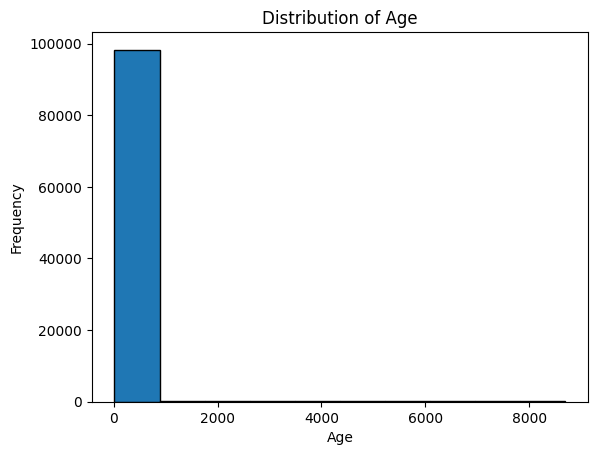

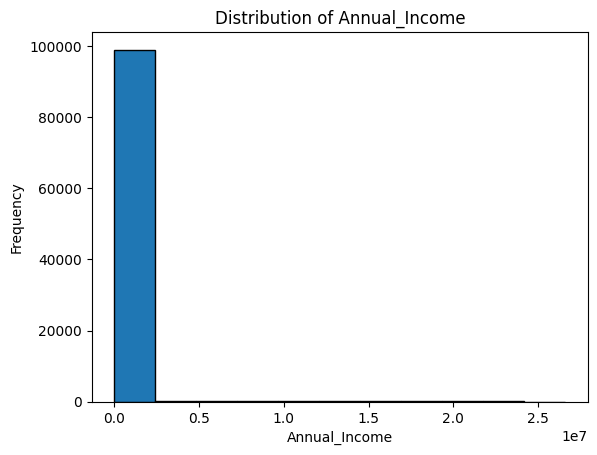

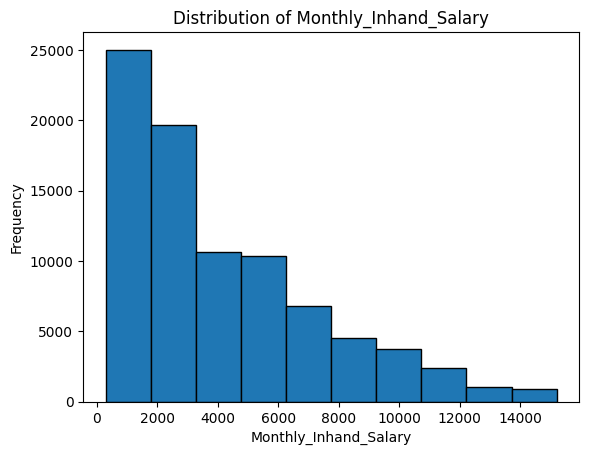

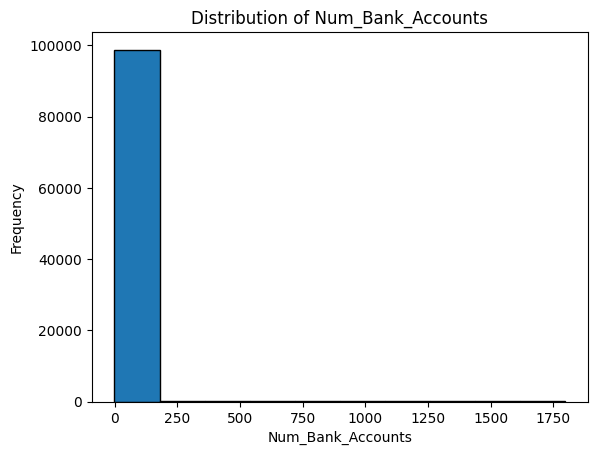

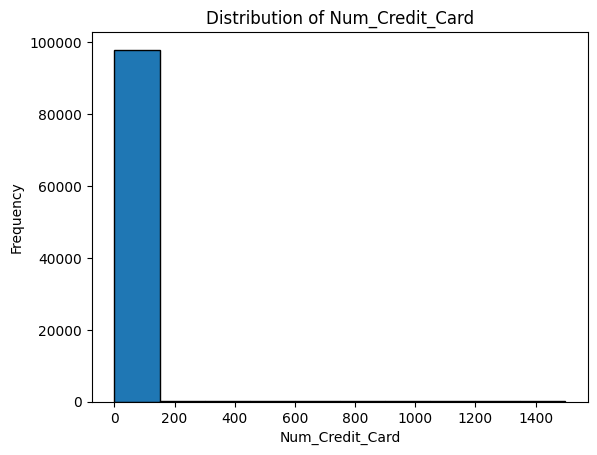

...

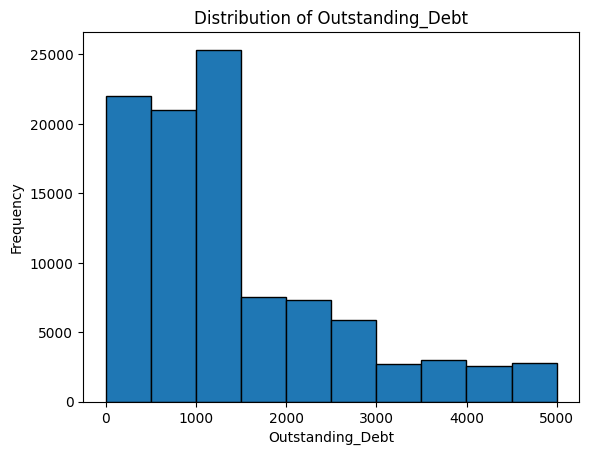

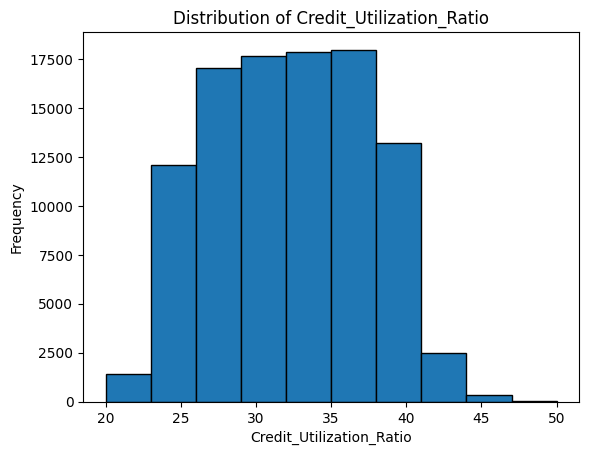

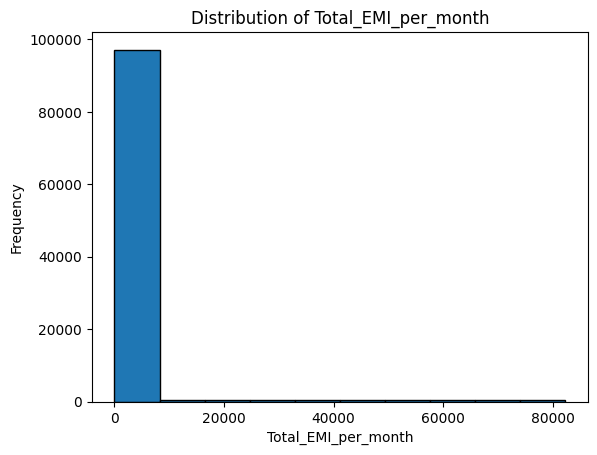

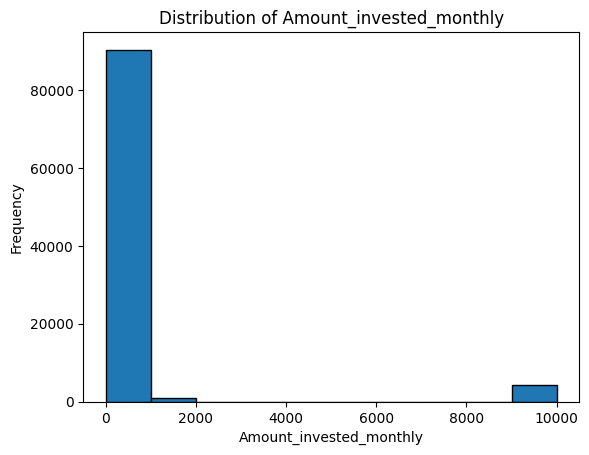

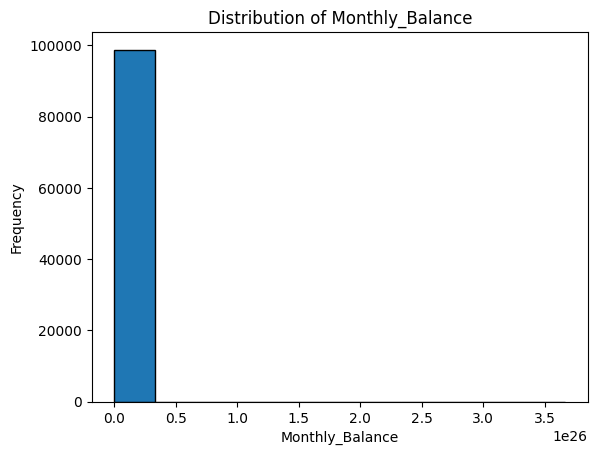

In [ ]:

for col in number_types:
    col_data = df[col].dropna()
    if col_data.empty:
        continue
    min_val = col_data.min()
    max_val = col_data.max()
    bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
    plt.hist(col_data, bins=bins, edgecolor='black')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {col}')
    plt.show()



We notice that some histograms are a single bar, which indicates that they are not normal and have many outliers

In [ ]:
df['Age'].describe()


,Age
count,100000.000000
mean,119.509700
std,684.757313
min,14.000000
25%,25.000000
50%,34.000000
75%,42.000000
max,8698.000000


In [ ]:
df['Age'] = df['Age'].clip(lower=18, upper=90)


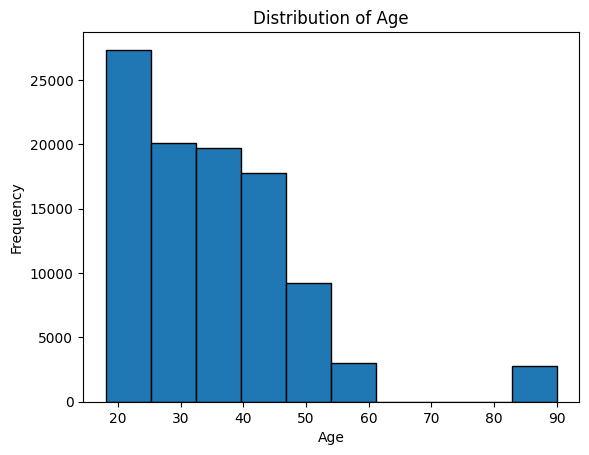

In [ ]:
col = 'Age'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

In [ ]:
df['Num_of_Delayed_Payment'].describe()

,Num_of_Delayed_Payment
count,92998.000000
mean,30.946268
std,226.028754
min,0.000000
25%,9.000000
50%,14.000000
75%,18.000000
max,4397.000000


In [ ]:
for num in range(0,150, 10):
  print(f"More than {num}:", df['Num_of_Delayed_Payment'][df['Num_of_Delayed_Payment'] > num].count())
for num in range(500, 4001, 500):
  print(f"More than {num}:", df['Num_of_Delayed_Payment'][df['Num_of_Delayed_Payment'] > num].count())

More than 0: 91389
More than 10: 61570
More than 20: 11725
More than 30: 736
More than 40: 736
More than 50: 733
More than 60: 732
More than 70: 732
More than 80: 730
More than 90: 726
More than 100: 724
More than 110: 721
More than 120: 721
More than 130: 719
More than 140: 717
More than 500: 662
More than 1000: 581
More than 1500: 503
More than 2000: 416
More than 2500: 330
More than 3000: 231
More than 3500: 145
More than 4000: 71


For the vast majority of our data, people have between 0-30 delayed payments

In [ ]:
median_val = df['Num_of_Delayed_Payment'].median(skipna=True)
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].fillna(median_val)

Median replacement on this column because of the skew. After training our model, we should try dropping these values and seeing if it performs better.

Around 736 have 30+ delayed payments


Choosing to clip these values to reduce outliers

In [ ]:
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].clip(lower=0, upper=50)

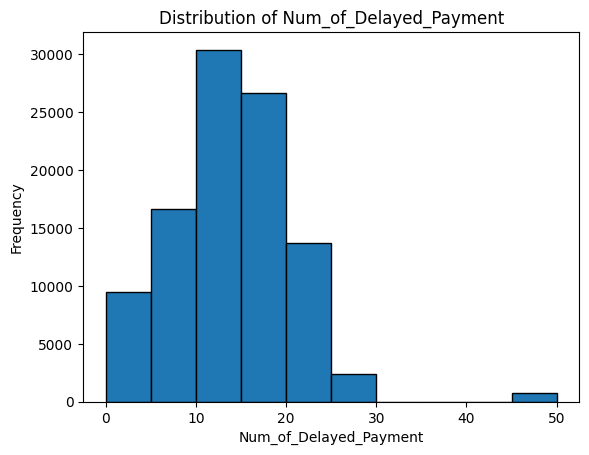

In [ ]:
col = 'Num_of_Delayed_Payment'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

Much better

In [ ]:
df['Amount_invested_monthly'].describe()

,Amount_invested_monthly
count,95521.000000
mean,637.412998
std,2043.319327
min,0.000000
25%,74.534002
50%,135.925682
75%,265.731733
max,10000.000000


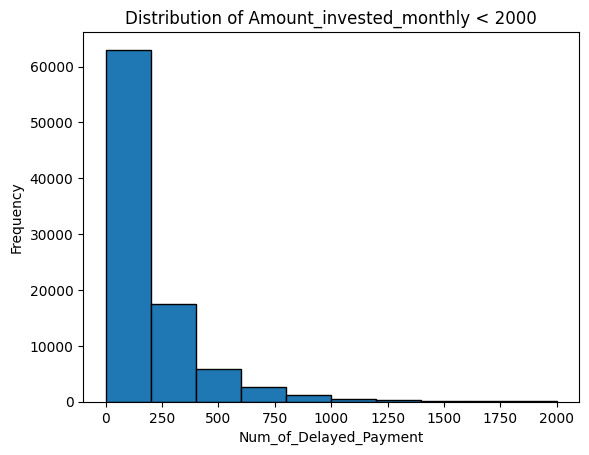

In [ ]:
col_data = df['Amount_invested_monthly'].dropna()
min_val = 0
max_val = 2000
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of Amount_invested_monthly < 2000')
plt.show()



This is plausible for the amount invested monthly, and from the histogram it makes sense

In [ ]:
q95 = df['Amount_invested_monthly'].quantile(0.95)
q99 = df['Amount_invested_monthly'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

df['Amount_invested_monthly'][df['Amount_invested_monthly'] > 1149.4].count()

95th percentile: 1149.4057853186484
99th percentile: 10000.0


np.int64(4777)

Around 4305 individuals investing a lot, can we try dropping these as well after training?
##DROP

In [ ]:
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].clip(upper=1149.4)

In [ ]:
df['Amount_invested_monthly'].isna().sum()

np.int64(4479)

In [ ]:
median_val = df['Amount_invested_monthly'].median(skipna=True)
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].fillna(median_val)

Median replace as well because of the skew

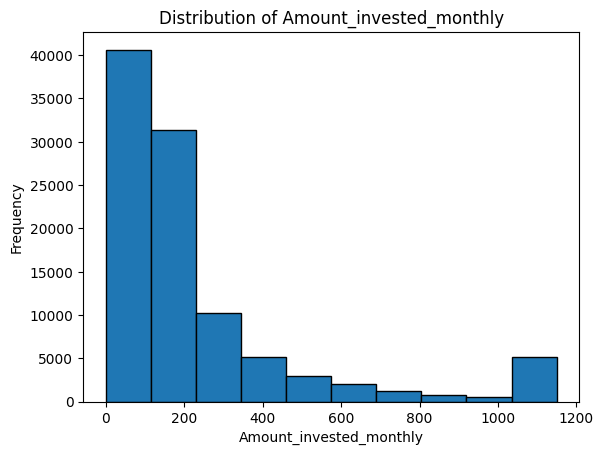

In [ ]:
col = 'Amount_invested_monthly'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

In [ ]:
df['Monthly_Balance'].describe()

,Monthly_Balance
count,9.880000e+04
mean,3.036437e+22
std,3.181295e+24
min,7.759665e-03
25%,2.701145e+02
50%,3.367423e+02
75%,4.703321e+02
max,3.333333e+26


Scale of the histogram is 1e26, which must be due to the large maximum value 3.3e26.

In [ ]:
print(df['Monthly_Balance'][df['Monthly_Balance'] < 0 ].count())
print(df['Monthly_Balance'][df['Monthly_Balance'] > 2000].count())
df['Monthly_Balance'][df['Monthly_Balance'] > 2000]

0
9


,Monthly_Balance
5545,3.333333e+26
26177,3.333333e+26
29158,3.333333e+26
35570,3.333333e+26
38622,3.333333e+26
60009,3.333333e+26
75251,3.333333e+26
82918,3.333333e+26
83255,3.333333e+26


In [ ]:
median_val = df['Monthly_Balance'].median(skipna=True)
df.loc[df['Monthly_Balance'] > 2000, 'Monthly_Balance'] = median_val
df['Monthly_Balance'] = df['Monthly_Balance'].fillna(median_val)

In [ ]:
df['Monthly_Balance'].describe()

,Monthly_Balance
count,100000.000000
mean,401.755628
std,212.749976
min,0.007760
25%,270.913865
50%,336.742315
75%,467.670597
max,1602.040519


In [ ]:
df['Monthly_Balance'].isna().sum()

np.int64(0)

In [ ]:
df['Annual_Income'].describe()

,Annual_Income
count,1.000000e+05
mean,1.764157e+05
std,1.429618e+06
min,7.005930e+03
25%,1.945750e+04
50%,3.757861e+04
75%,7.279092e+04
max,2.419806e+07


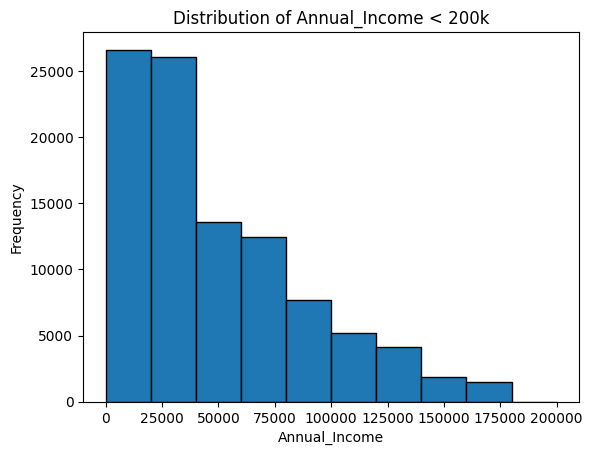

In [ ]:
col = 'Annual_Income'
col_data = df['Annual_Income'].dropna()
min_val = 0
max_val = 200000
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of Annual_Income < 200k')
plt.show()



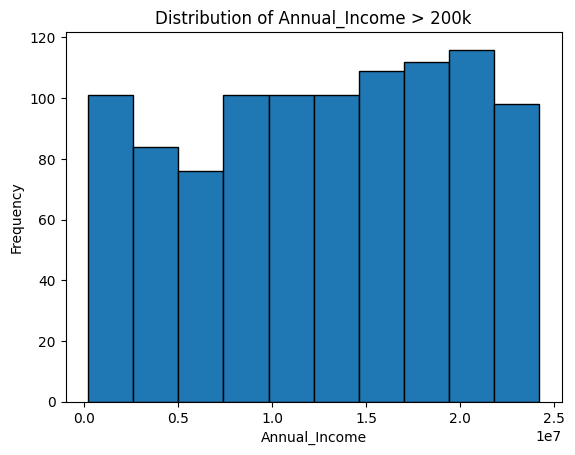

In [ ]:
col = 'Annual_Income'
col_data = df['Annual_Income'].dropna()
min_val = 200000
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of Annual_Income > 200k')
plt.show()



In [ ]:
q95 = df['Annual_Income'].quantile(0.95)
q99 = df['Annual_Income'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 134533.32
99th percentile: 179987.28


In [ ]:
df['Annual_Income'] = df['Annual_Income'].clip(upper=q99)

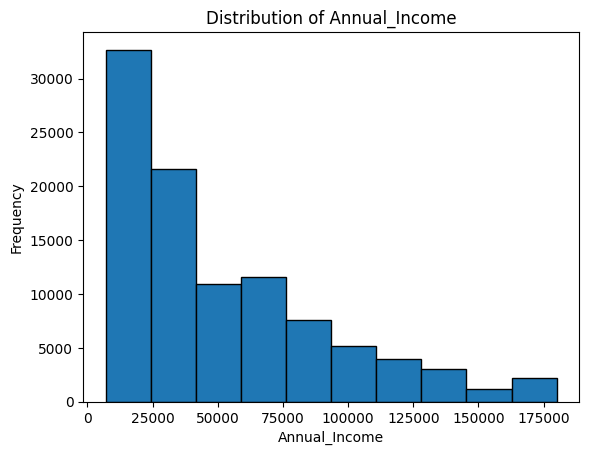

In [ ]:
col = 'Annual_Income'
col_data = df['Annual_Income'].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of Annual_Income')
plt.show()



Around 1000 people make well above 200k in our dataset. This is 1% of our data, so we can also consider dropping it after training

##DROP


In [ ]:
df['Num_of_Loan'].describe()

,Num_of_Loan
count,100000.000000
mean,10.761960
std,61.789933
min,0.000000
25%,2.000000
50%,3.000000
75%,6.000000
max,1496.000000


In [ ]:
for num in range(0,150, 10):
  print(f"More than {num}:", df['Num_of_Loan'][df['Num_of_Loan'] > num].count())
for num in range(500, 1001, 500):
  print(f"More than {num}:", df['Num_of_Loan'][df['Num_of_Loan'] > num].count())

More than 0: 89070
More than 10: 4348
More than 20: 4345
More than 30: 4341
More than 40: 4335
More than 50: 4330
More than 60: 4324
More than 70: 4322
More than 80: 4321
More than 90: 4317
More than 100: 437
More than 110: 435
More than 120: 434
More than 130: 432
More than 140: 427
More than 500: 306
More than 1000: 159


The vast majority of our dataset has fewer than 10 loans. For the rest, we can also consider dropping later on.

##DROP

In [ ]:
q95 = df['Num_of_Loan'].quantile(0.95)
q99 = df['Num_of_Loan'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 9.0
99th percentile: 100.0


In [ ]:
df['Num_of_Loan'] = df['Num_of_Loan'].clip(upper=q95)

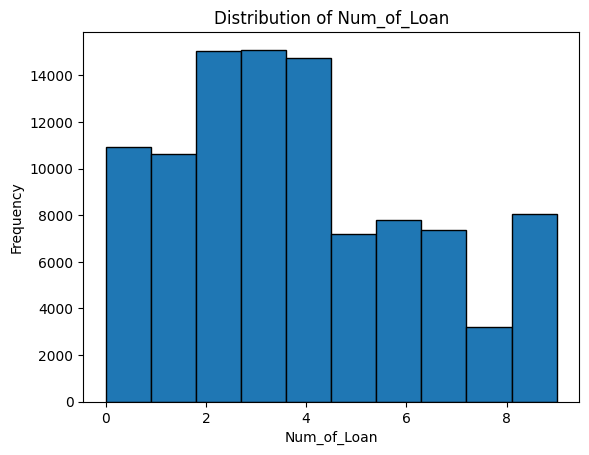

In [ ]:
col = 'Num_of_Loan'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

In [ ]:
df['Changed_Credit_Limit'].describe()

,Changed_Credit_Limit
count,97909.000000
mean,10.465678
std,6.670732
min,0.000000
25%,5.350000
50%,9.400000
75%,14.870000
max,36.970000


Very reasonable range, but missing values. From the histogram, there is a slight skew, so we should just do median replacement.

In [ ]:
median_val = df['Changed_Credit_Limit'].median(skipna=True)
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].fillna(median_val)

In [ ]:
df['Changed_Credit_Limit'].isna().sum()

np.int64(0)

In [ ]:
df['Outstanding_Debt'].describe()

,Outstanding_Debt
count,100000.000000
mean,1426.220376
std,1155.129026
min,0.230000
25%,566.072500
50%,1166.155000
75%,1945.962500
max,4998.070000


Also very reasonable, and no missing values. This column is good

In [ ]:
df['Monthly_Inhand_Salary'].describe()

,Monthly_Inhand_Salary
count,84998.000000
mean,4194.170850
std,3183.686167
min,303.645417
25%,1625.568229
50%,3093.745000
75%,5957.448333
max,15204.633333


Very reasonable, just need to do median replacement on missing values

In [ ]:
median_val = df['Monthly_Inhand_Salary'].median(skipna=True)
df['Monthly_Inhand_Salary'] = df['Monthly_Inhand_Salary'].fillna(median_val)

In [ ]:
df['Num_Bank_Accounts'].describe()

,Num_Bank_Accounts
count,100000.000000
mean,17.091280
std,117.404834
min,-1.000000
25%,3.000000
50%,6.000000
75%,7.000000
max,1798.000000


There is a negative value, and some with 1000+ bank accounts

In [ ]:
for num in range(5,15, 1):
  print(f"More than {num}:", df['Num_Bank_Accounts'][df['Num_Bank_Accounts'] > num].count())

for num in range(100,1000, 100):
  print(f"More than {num}:", df['Num_Bank_Accounts'][df['Num_Bank_Accounts'] > num].count())

More than 5: 50603
More than 6: 37602
More than 7: 24779
More than 8: 12014
More than 9: 6571
More than 10: 1324
More than 11: 1315
More than 12: 1315
More than 13: 1315
More than 14: 1315
More than 100: 1246
More than 200: 1175
More than 300: 1110
More than 400: 1031
More than 500: 953
More than 600: 872
More than 700: 805
More than 800: 742
More than 900: 646


In [ ]:
q95 = df['Num_Bank_Accounts'].quantile(0.95)
q99 = df['Num_Bank_Accounts'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 10.0
99th percentile: 445.00999999999476


Around 1246 individuals have more than 100 bank accounts, we can also try to drop these later
##DROP

In [ ]:
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'].clip(upper=q95)

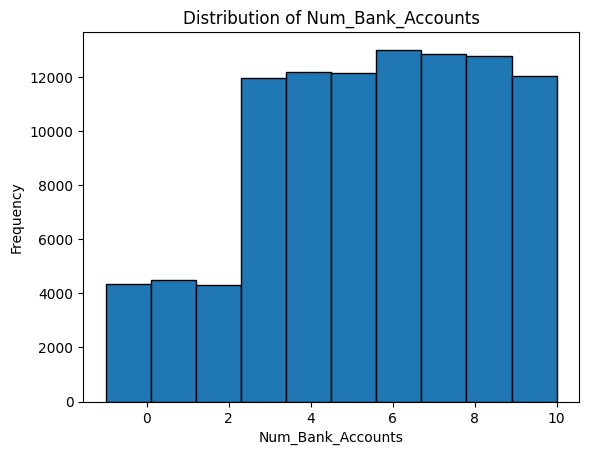

In [ ]:
col = 'Num_Bank_Accounts'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

In [ ]:
df['Num_Credit_Card'].describe()

,Num_Credit_Card
count,100000.00000
mean,22.47443
std,129.05741
min,0.00000
25%,4.00000
50%,5.00000
75%,7.00000
max,1499.00000


Some people with 1000+ credit cards as well

In [ ]:
for num in range(5,10, 1):
  print(f"More than {num}:", df['Num_Credit_Card'][df['Num_Credit_Card'] > num].count())
for num in range(10,150, 10):
  print(f"More than {num}:", df['Num_Credit_Card'][df['Num_Credit_Card'] > num].count())

More than 5: 49940
More than 6: 33381
More than 7: 16766
More than 8: 11810
More than 9: 7167
More than 10: 2307
More than 20: 2263
More than 30: 2244
More than 40: 2226
More than 50: 2214
More than 60: 2200
More than 70: 2181
More than 80: 2162
More than 90: 2145
More than 100: 2130
More than 110: 2104
More than 120: 2091
More than 130: 2075
More than 140: 2060


Around 2000 people have more than 100 credit cards. We can drop these later as well.
##DROP

In [ ]:
q95 = df['Num_Credit_Card'].quantile(0.95)
q99 = df['Num_Credit_Card'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 10.0
99th percentile: 849.0


In [ ]:
df['Num_Credit_Card'] = df['Num_Credit_Card'].clip(upper=q95)

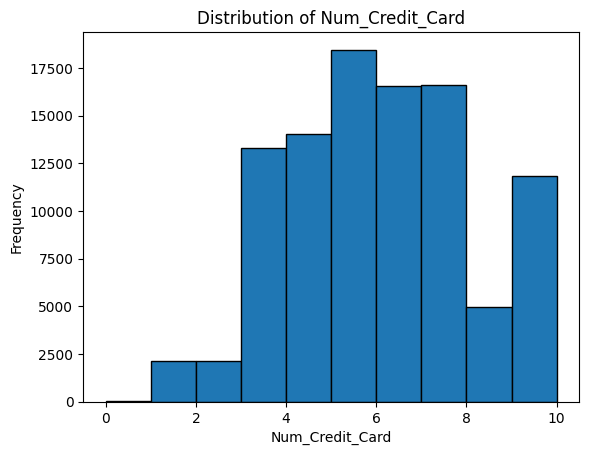

In [ ]:
col = 'Num_Credit_Card'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

In [ ]:
df['Interest_Rate'].describe()

,Interest_Rate
count,100000.000000
mean,72.466040
std,466.422621
min,1.000000
25%,8.000000
50%,13.000000
75%,20.000000
max,5797.000000


In [ ]:
for num in range(1,22, 5):
  print(f"More than {num}:", df['Interest_Rate'][df['Interest_Rate'] > num].count())
for num in range(100,5001, 1000):
  print(f"More than {num}:", df['Interest_Rate'][df['Interest_Rate'] > num].count())

More than 1: 97317
More than 6: 79798
More than 11: 56830
More than 16: 39955
More than 21: 22921
More than 100: 2012
More than 1100: 1645
More than 2100: 1288
More than 3100: 910
More than 4100: 567


In [ ]:
q95 = df['Interest_Rate'].quantile(0.95)
q99 = df['Interest_Rate'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 33.0
99th percentile: 2865.0099999999948


In [ ]:
df['Interest_Rate'] = df['Interest_Rate'].clip(upper=q95)

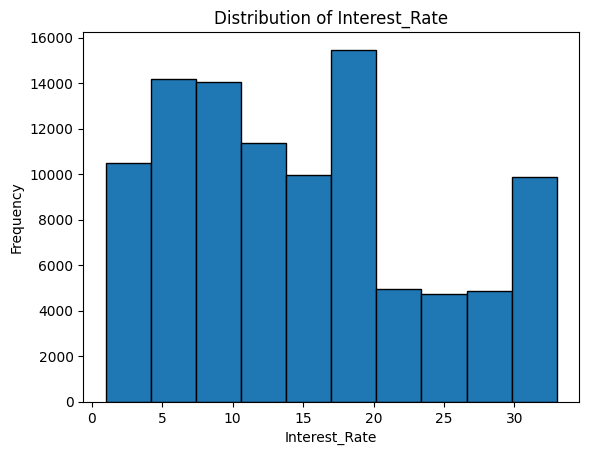

In [ ]:
col = 'Interest_Rate'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

Around 2012 individuals have an interest rate greater than 100, we can also try to drop
##DROP

In [ ]:
df['Delay_from_due_date'].describe()

,Delay_from_due_date
count,100000.000000
mean,21.068780
std,14.860104
min,-5.000000
25%,10.000000
50%,18.000000
75%,28.000000
max,67.000000


Looks good, aside from the negative values. But it could also mean they paid early?

In [ ]:
df['Delay_from_due_date'][df['Delay_from_due_date'] < 0].count()

np.int64(591)

Hard to believe of 100000 individuals, only 591 paid early, so maybe we should clean this. Other than that, the values are solid

In [ ]:
df['Num_Credit_Inquiries'].describe()

,Num_Credit_Inquiries
count,98035.000000
mean,27.754251
std,193.177339
min,0.000000
25%,3.000000
50%,6.000000
75%,9.000000
max,2597.000000


In [ ]:
for num in range(1,10, 1):
  print(f"More than {num}:", df['Num_Credit_Inquiries'][df['Num_Credit_Inquiries'] > num].count())
for num in range(50,2000, 100):
  print(f"More than {num}:", df['Num_Credit_Inquiries'][df['Num_Credit_Inquiries'] > num].count())

More than 1: 83475
More than 2: 75447
More than 3: 66557
More than 4: 55286
More than 5: 49593
More than 6: 41482
More than 7: 33424
More than 8: 25558
More than 9: 20275
More than 50: 1634
More than 150: 1575
More than 250: 1509
More than 350: 1436
More than 450: 1382
More than 550: 1318
More than 650: 1252
More than 750: 1195
More than 850: 1136
More than 950: 1080
More than 1050: 1011
More than 1150: 951
More than 1250: 860
More than 1350: 786
More than 1450: 715
More than 1550: 650
More than 1650: 591
More than 1750: 543
More than 1850: 474
More than 1950: 417


In [ ]:
q95 = df['Num_Credit_Inquiries'].quantile(0.95)
q99 = df['Num_Credit_Inquiries'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 13.0
99th percentile: 1109.280000000028


In [ ]:
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].clip(upper=q95)

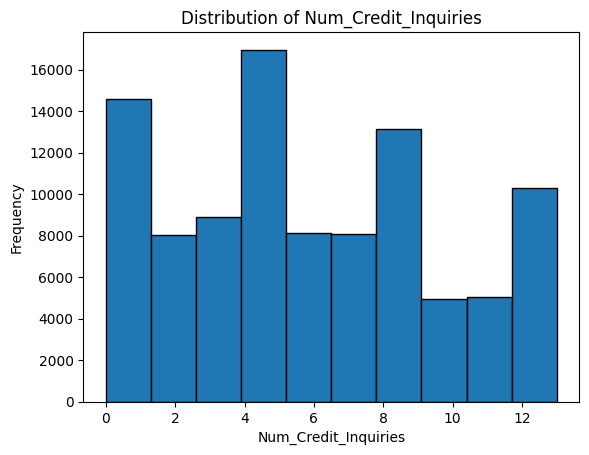

In [ ]:
col = 'Num_Credit_Inquiries'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

Around 1634 entries have 50+ credit inquiries, the rest are below 10. Can also potentially drop, but doing median replacement for missing values.
##DROP

In [ ]:
median_val = df['Num_Credit_Inquiries'].median(skipna=True)
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'].fillna(median_val)

In [ ]:
df['Credit_Utilization_Ratio'].describe()

,Credit_Utilization_Ratio
count,100000.000000
mean,32.285173
std,5.116875
min,20.000000
25%,28.052567
50%,32.305784
75%,36.496663
max,50.000000


Balanced from the histogram and describe, so will not change

In [ ]:
df['Total_EMI_per_month'].describe()

,Total_EMI_per_month
count,100000.000000
mean,1403.118217
std,8306.041270
min,0.000000
25%,30.306660
50%,69.249473
75%,161.224249
max,82331.000000


In [ ]:
for num in range(1,301, 50):
  print(f"More than {num}:", df['Total_EMI_per_month'][df['Total_EMI_per_month'] > num].count())
for num in range(10000,90000, 10000):
  print(f"More than {num}:", df['Total_EMI_per_month'][df['Total_EMI_per_month'] > num].count())

More than 1: 89387
More than 51: 60950
More than 101: 37644
More than 151: 26636
More than 201: 18448
More than 251: 12688
More than 10000: 2806
More than 20000: 2390
More than 30000: 2000
More than 40000: 1618
More than 50000: 1227
More than 60000: 850
More than 70000: 463
More than 80000: 86


Around 2806 individuals have over 10000 EMI, while the rest are below 250. We can also drop here.
##DROP

In [ ]:
q95 = df['Total_EMI_per_month'].quantile(0.95)
q99 = df['Total_EMI_per_month'].quantile(0.99)

print("95th percentile:", q95)
print("99th percentile:", q99)

95th percentile: 437.01275293262665
99th percentile: 56125.29999999984


In [ ]:
df['Total_EMI_per_month'] = df['Total_EMI_per_month'].clip(upper=q95)

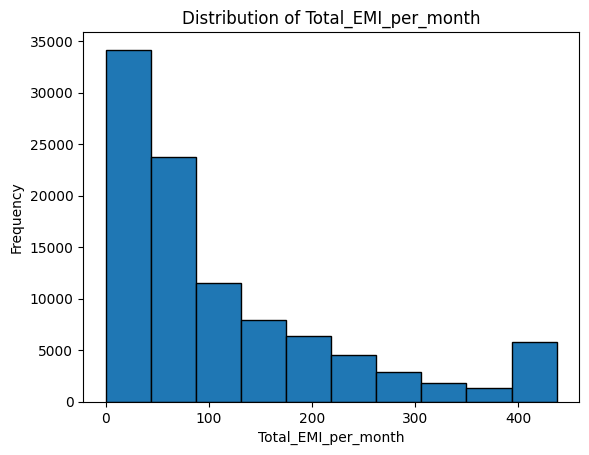

In [ ]:
col = 'Total_EMI_per_month'
col_data = df[col].dropna()
min_val = col_data.min()
max_val = col_data.max()
bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
plt.hist(col_data, bins=bins, edgecolor='black')
plt.xlabel(col)
plt.ylabel('Frequency')
plt.title(f'Distribution of {col}')
plt.show()

In [ ]:
df[number_types].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Age                       100000 non-null  int64  
 1   Annual_Income             100000 non-null  float64
 2   Monthly_Inhand_Salary     100000 non-null  float64
 3   Num_Bank_Accounts         100000 non-null  int64  
 4   Num_Credit_Card           100000 non-null  int64  
 5   Interest_Rate             100000 non-null  int64  
 6   Num_of_Loan               100000 non-null  int64  
 7   Delay_from_due_date       100000 non-null  int64  
 8   Num_of_Delayed_Payment    100000 non-null  float64
 9   Changed_Credit_Limit      100000 non-null  float64
 10  Num_Credit_Inquiries      100000 non-null  float64
 11  Outstanding_Debt          100000 non-null  float64
 12  Credit_Utilization_Ratio  100000 non-null  float64
 13  Total_EMI_per_month       100000 non-null  fl

No more null values or incorrect values. Now to handle strings

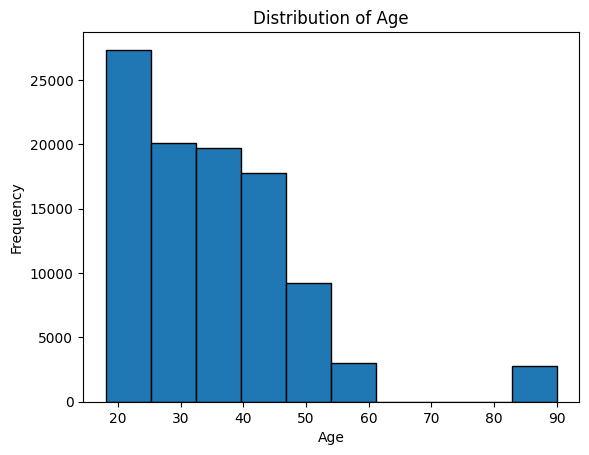

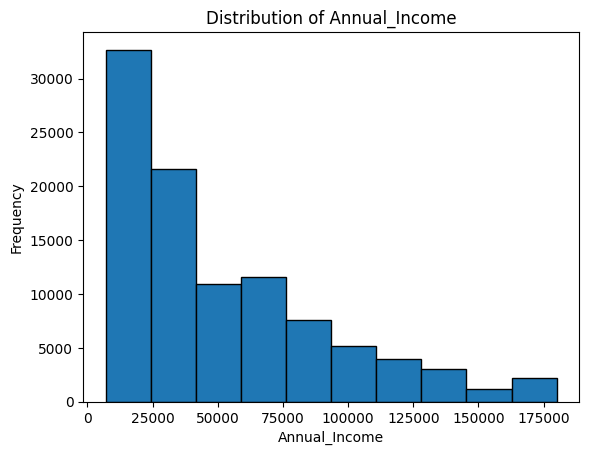

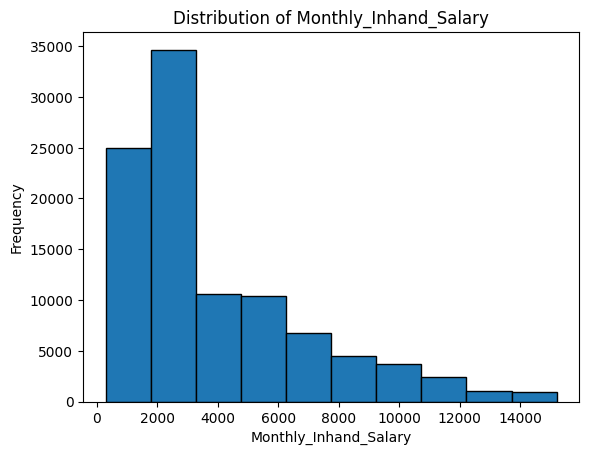

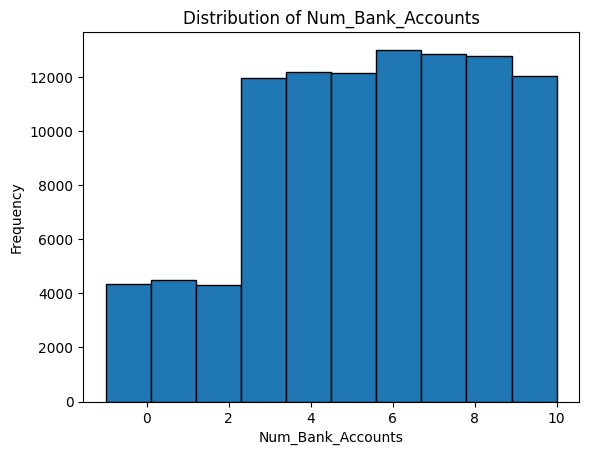

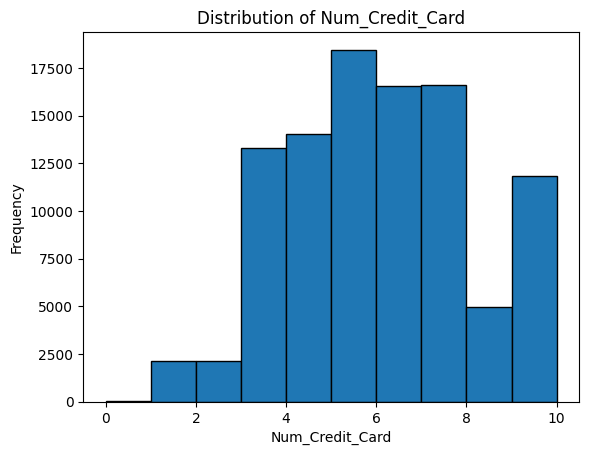

...

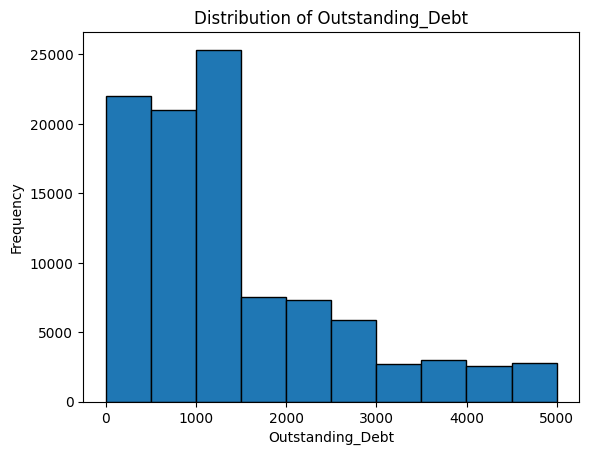

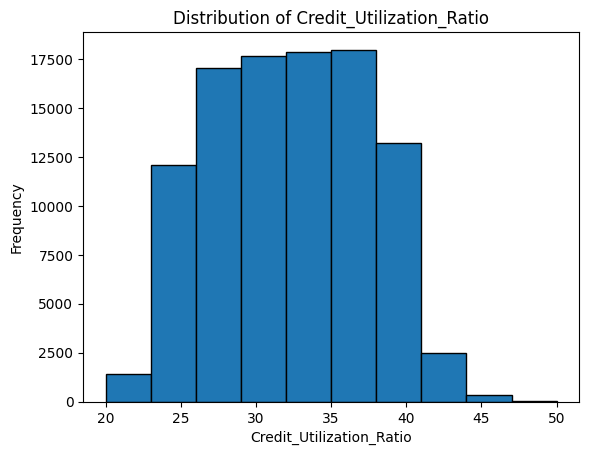

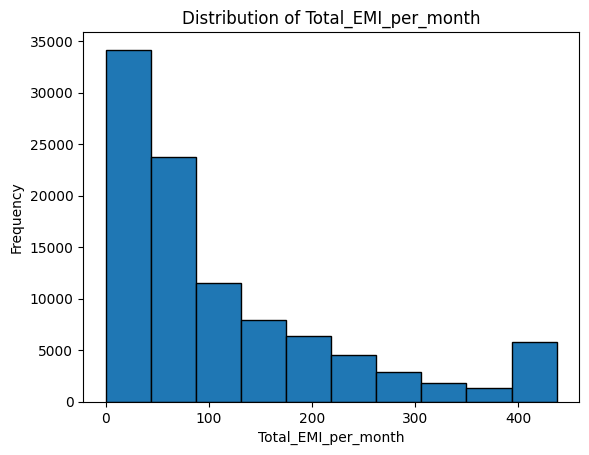

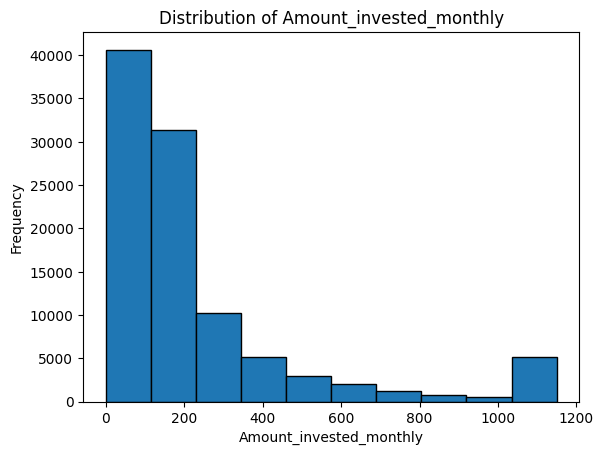

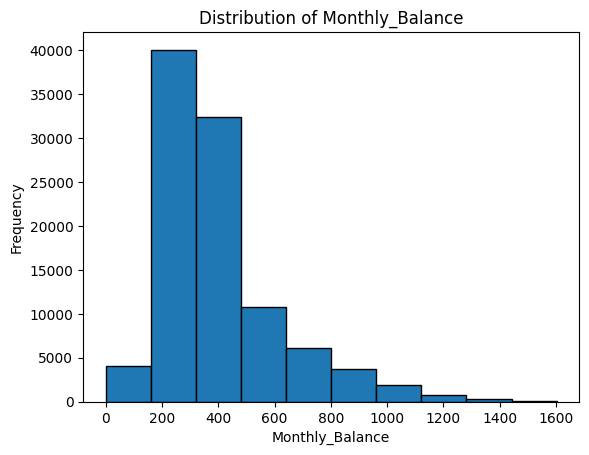

In [ ]:

for col in number_types:
    col_data = df[col].dropna()
    if col_data.empty:
        continue
    min_val = col_data.min()
    max_val = col_data.max()
    bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
    plt.hist(col_data, bins=bins, edgecolor='black')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {col}')
    plt.show()



In [ ]:
string_types = df.select_dtypes(include=('object')).columns.tolist()
df[string_types]

,ID,Customer_ID,Month,Occupation,Type_of_Loan,Credit_Mix,Credit_History_Age,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
0,0x1602,CUS_0xd40,January,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",_,22 Years and 1 Months,No,High_spent_Small_value_payments,Good
1,0x1603,CUS_0xd40,February,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,NaN,No,Low_spent_Large_value_payments,Good
2,0x1604,CUS_0xd40,March,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 3 Months,No,Low_spent_Medium_value_payments,Good
3,0x1605,CUS_0xd40,April,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 4 Months,No,Low_spent_Small_value_payments,Good
4,0x1606,CUS_0xd40,May,Scientist,"Auto Loan, Credit-Builder Loan, Personal Loan,...",Good,22 Years and 5 Months,No,High_spent_Medium_value_payments,Good
...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Mechanic,"Auto Loan, and Student Loan",_,31 Years and 6 Months,No,High_spent_Large_value_payments,Poor
99996,0x25fea,CUS_0x942c,May,Mechanic,"Auto Loan, and Student Loan",_,31 Years and 7 Months,No,High_spent_Medium_value_payments,Poor
99997,0x25feb,CUS_0x942c,June,Mechanic,"Auto Loan, and Student Loan",Good,31 Years and 8 Months,No,High_spent_Large_value_payments,Poor
99998,0x25fec,CUS_0x942c,July,Mechanic,"Auto Loan, and Student Loan",Good,31 Years and 9 Months,No,Low_spent_Large_value_payments,Standard


In [ ]:
df['Occupation'].unique().tolist()

['Scientist',
 '_______',
 'Teacher',
 'Engineer',
 'Entrepreneur',
 'Developer',
 'Lawyer',
 'Media_Manager',
 'Doctor',
 'Journalist',
 'Manager',
 'Accountant',
 'Musician',
 'Mechanic',
 'Writer',
 'Architect']

In [ ]:
df['Occupation'].value_counts()

,count
Occupation,
_______,7062
Lawyer,6575
Architect,6355
Engineer,6350
Scientist,6299
Mechanic,6291
Accountant,6271
Developer,6235
Media_Manager,6232


In [ ]:
df['Occupation'] = df['Occupation'].replace(['', '_______'], 'Unknown') #instead of using drop, i am replacing with Unknown


7062 counts of missing values

In [ ]:
df['Type_of_Loan'][:100].unique().tolist()

['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
 'Credit-Builder Loan',
 'Auto Loan, Auto Loan, and Not Specified',
 'Not Specified',
 nan,
 'Credit-Builder Loan, and Mortgage Loan',
 'Not Specified, Auto Loan, and Student Loan',
 'Personal Loan, Debt Consolidation Loan, and Auto Loan',
 'Not Specified, and Payday Loan',
 'Credit-Builder Loan, Personal Loan, and Auto Loan',
 'Payday Loan, and Payday Loan',
 'Not Specified, Student Loan, and Personal Loan']

In [ ]:
df['Type_of_Loan'].isna().sum()

np.int64(11408)

We should encode these later, but for now we will replace nulls with unknowns as well

In [ ]:
df['Type_of_Loan'].fillna("Unknown", inplace=True)

/tmp/ipython-input-1996732085.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Type_of_Loan'].fillna("Unknown", inplace=True)


In [ ]:
df['Credit_History_Age'][:20].unique().tolist()

['22 Years and 1 Months',
 nan,
 '22 Years and 3 Months',
 '22 Years and 4 Months',
 '22 Years and 5 Months',
 '22 Years and 6 Months',
 '22 Years and 7 Months',
 '26 Years and 7 Months',
 '26 Years and 8 Months',
 '26 Years and 9 Months',
 '26 Years and 10 Months',
 '26 Years and 11 Months',
 '27 Years and 0 Months',
 '27 Years and 1 Months',
 '27 Years and 2 Months',
 '17 Years and 9 Months',
 '17 Years and 10 Months',
 '17 Years and 11 Months']

In [ ]:
df['Credit_History_Age'].isna().sum()

np.int64(9030)

We will convert these to numbers and then do replacement on the null values.

In [ ]:
def convert_to_months(val):
    if pd.isna(val):
        return np.nan
    parts = val.split()
    years = int(parts[0])
    months = int(parts[3])
    return int(years * 12 + months)
df['Credit_History_Age'] = df['Credit_History_Age'].apply(convert_to_months)

In [ ]:
df['Credit_History_Age'].describe()

,Credit_History_Age
count,90970.000000
mean,221.195405
std,99.741364
min,1.000000
25%,144.000000
50%,219.000000
75%,302.000000
max,404.000000


Very resaonable, just going to do median replacement.

In [ ]:
median_val = df['Credit_History_Age'].median(skipna=True)
df['Credit_History_Age'] = df['Credit_History_Age'].fillna(median_val)

In [ ]:
string_types.remove('Credit_History_Age')
number_types.append('Credit_History_Age')

In [ ]:
df['Credit_Mix'].unique().tolist()

['_', 'Good', 'Standard', 'Bad']

In [ ]:
df['Credit_Mix'].value_counts()

,count
Credit_Mix,
Standard,36479
Good,24337
_,20195
Bad,18989


20k values ~20% is blank, how should we handle this? For now, setting these to Standard but perhaps we can use a linear regression to predict this
##IMPROVE

In [ ]:
df.loc[df['Credit_Mix'] == '_', 'Credit_Mix'] = 'Standard'


In [ ]:
df['Credit_Score'][:100].unique().tolist()

['Good', 'Standard', 'Poor']

Nothing to change for Credit Score

In [ ]:
df['Payment_of_Min_Amount'].unique().tolist()

['No', 'NM', 'Yes']

Nothing to change for Payment of Min Amount

In [ ]:
df['Payment_Behaviour'].unique().tolist()

['High_spent_Small_value_payments',
 'Low_spent_Large_value_payments',
 'Low_spent_Medium_value_payments',
 'Low_spent_Small_value_payments',
 'High_spent_Medium_value_payments',
 '!@9#%8',
 'High_spent_Large_value_payments']

In [ ]:
df['Payment_Behaviour'].value_counts()

,count
Payment_Behaviour,
Low_spent_Small_value_payments,25513
High_spent_Medium_value_payments,17540
Low_spent_Medium_value_payments,13861
High_spent_Large_value_payments,13721
High_spent_Small_value_payments,11340
Low_spent_Large_value_payments,10425
!@9#%8,7600


7.6% of data is bad, will just set to Unknown for now

In [ ]:
df.loc[df['Payment_Behaviour'] == '!@9#%8', 'Payment_Behaviour'] = 'Unknown'


In [ ]:
df[string_types].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   ID                     100000 non-null  object
 1   Customer_ID            100000 non-null  object
 2   Month                  100000 non-null  object
 3   Occupation             100000 non-null  object
 4   Type_of_Loan           100000 non-null  object
 5   Credit_Mix             100000 non-null  object
 6   Payment_of_Min_Amount  100000 non-null  object
 7   Payment_Behaviour      100000 non-null  object
 8   Credit_Score           100000 non-null  object
dtypes: object(9)
memory usage: 6.9+ MB


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Age                       100000 non-null  int64  
 4   Occupation                100000 non-null  object 
 5   Annual_Income             100000 non-null  float64
 6   Monthly_Inhand_Salary     100000 non-null  float64
 7   Num_Bank_Accounts         100000 non-null  int64  
 8   Num_Credit_Card           100000 non-null  int64  
 9   Interest_Rate             100000 non-null  int64  
 10  Num_of_Loan               100000 non-null  int64  
 11  Type_of_Loan              100000 non-null  object 
 12  Delay_from_due_date       100000 non-null  int64  
 13  Num_of_Delayed_Payment    100000 non-null  fl

Everything has been cleaned, with the exception of some outliers that we can try dropping later.

##Applying a groupby here for numerical values

In [ ]:
df.shape

(100000, 26)

In [ ]:
customer_summary = (
    df.groupby('Customer_ID').agg({
        'Age': 'first',
        'Occupation': lambda x: x.mode()[0],
        'Annual_Income': 'mean',
        'Monthly_Inhand_Salary': 'mean',
        'Num_Bank_Accounts': 'mean',
        'Num_Credit_Card': 'mean',
        'Interest_Rate': 'mean',
        'Num_of_Loan': 'mean',
        'Type_of_Loan': lambda x: ', '.join(x.astype(str)),
        'Delay_from_due_date': 'mean',
        'Num_of_Delayed_Payment': 'mean',
        'Changed_Credit_Limit': 'mean',
        'Num_Credit_Inquiries': 'mean',
        'Credit_Mix': lambda x: x.mode()[0],
        'Outstanding_Debt': 'mean',
        'Credit_Utilization_Ratio': 'mean',
        'Credit_History_Age': 'max',
        'Payment_of_Min_Amount': lambda x: x.mode()[0],
        'Total_EMI_per_month': 'mean',
        'Amount_invested_monthly': 'mean',
        'Payment_Behaviour': lambda x: x.mode()[0],
        'Monthly_Balance': 'mean',
        'Credit_Score': lambda x: x.mode()[0],
    }).reset_index()
)


In [ ]:
customer_summary.shape

(12500, 24)

In [ ]:
customer_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_ID               12500 non-null  object 
 1   Age                       12500 non-null  int64  
 2   Occupation                12500 non-null  object 
 3   Annual_Income             12500 non-null  float64
 4   Monthly_Inhand_Salary     12500 non-null  float64
 5   Num_Bank_Accounts         12500 non-null  float64
 6   Num_Credit_Card           12500 non-null  float64
 7   Interest_Rate             12500 non-null  float64
 8   Num_of_Loan               12500 non-null  float64
 9   Type_of_Loan              12500 non-null  object 
 10  Delay_from_due_date       12500 non-null  float64
 11  Num_of_Delayed_Payment    12500 non-null  float64
 12  Changed_Credit_Limit      12500 non-null  float64
 13  Num_Credit_Inquiries      12500 non-null  float64
 14  Credit

2 columns, the customer id and month have been excluded

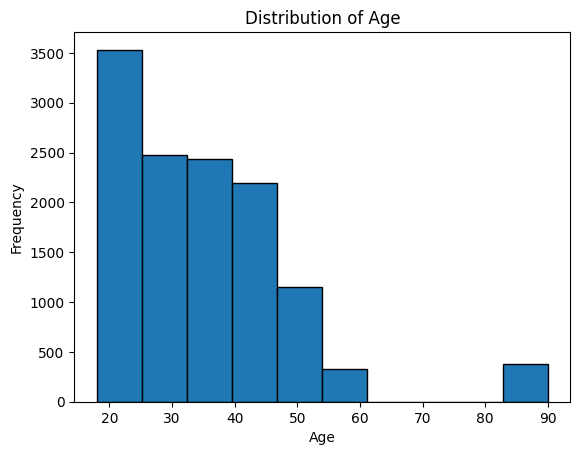

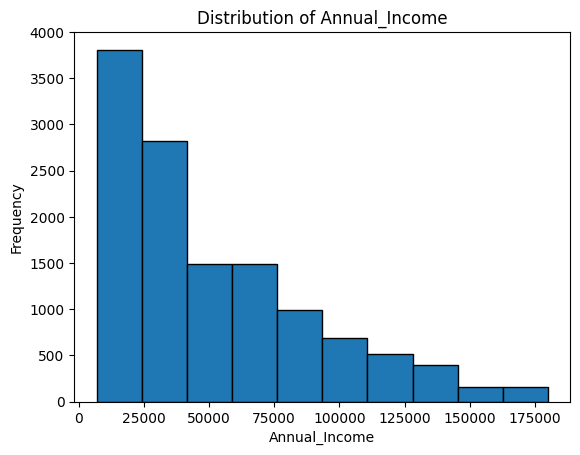

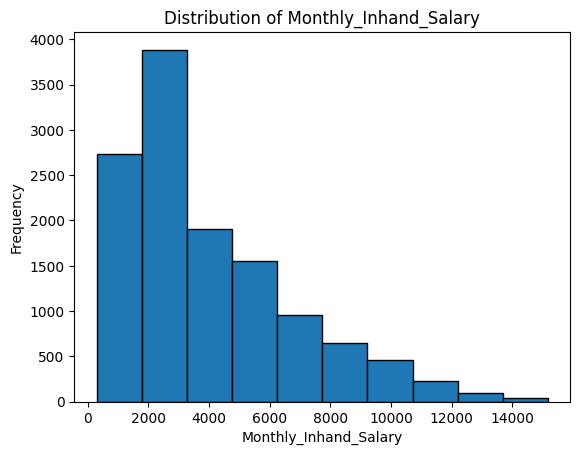

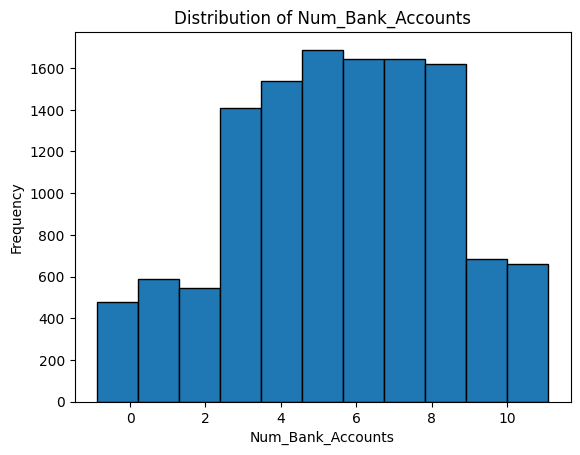

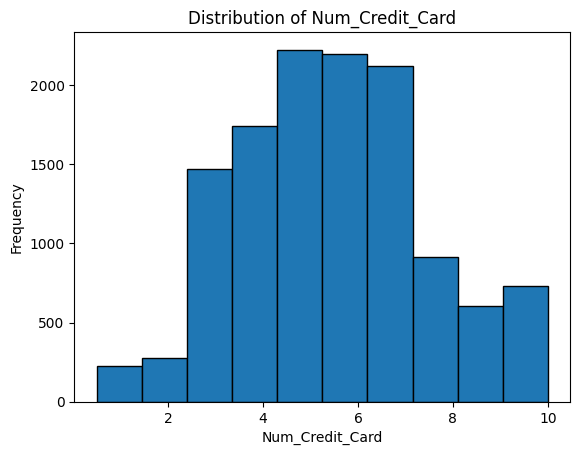

...

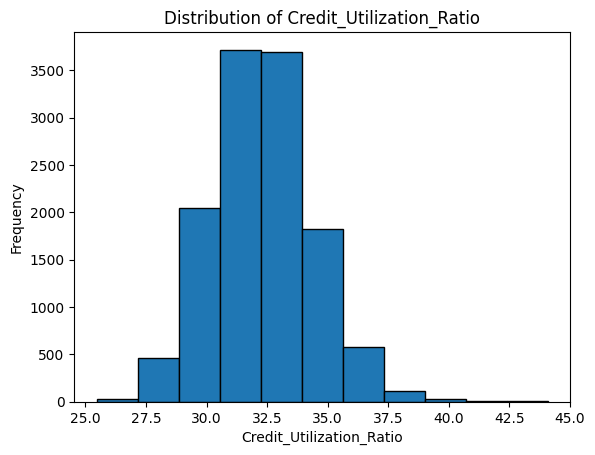

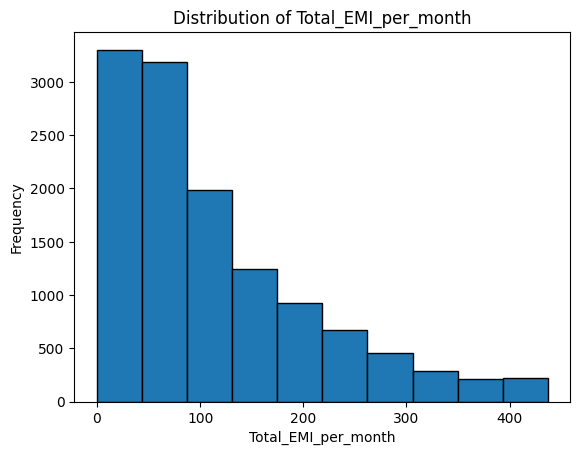

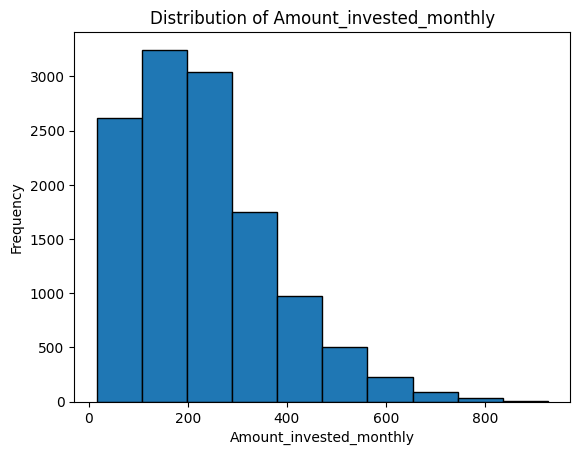

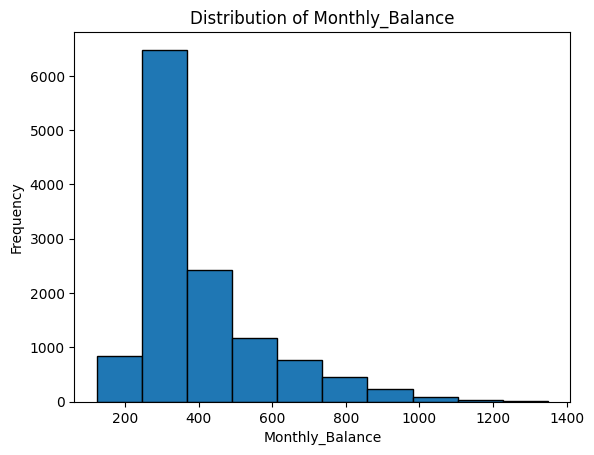

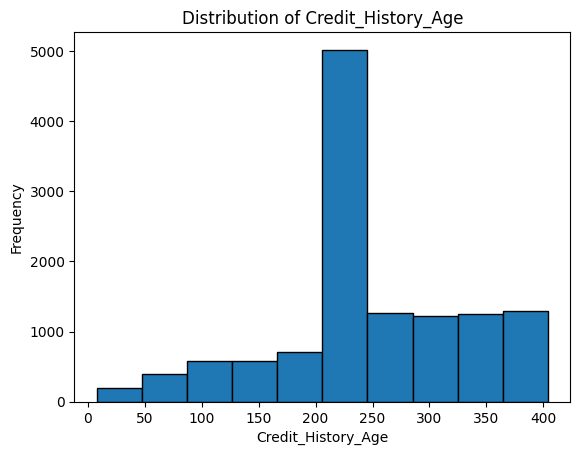

In [ ]:

for col in number_types:
    col_data = customer_summary[col].dropna()
    if col_data.empty:
        continue
    min_val = col_data.min()
    max_val = col_data.max()
    bins = np.arange(min_val, max_val + (max_val - min_val) / 10, (max_val - min_val) / 10)
    plt.hist(col_data, bins=bins, edgecolor='black')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {col}')
    plt.show()



In [ ]:
df_old = df
df = customer_summary

## Task 2 of Milestone 1: Standardize categorical variables, normalize numerical features

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler, OrdinalEncoder
# make a copy to compare before/after
df_compare = df[['Credit_Score', 'Credit_Mix']].copy()

# Encode Credit_Score (Poor < Standard < Good)
score_map = {'Poor': 0, 'Standard': 1, 'Good': 2}
df_compare['Credit_Score_Encoded'] = df_compare['Credit_Score'].map(score_map)

# Encode Credit_Mix (Bad < Poor < Standard < Good)
mix_map = {'Bad': 0, 'Standard': 1, 'Good': 2}
df_compare['Credit_Mix_Encoded'] = df_compare['Credit_Mix'].map(mix_map)

# Show first 10 rows before & after
print(" BEFORE & AFTER ENCODING (first 10 rows)")
print(df_compare.head(10))


print("\nUnique values in 'Credit_Score_Encoded':", np.sort(df_compare['Credit_Score_Encoded'].unique()))
print("Unique values in 'Credit_Mix_Encoded':", np.sort(df_compare['Credit_Mix_Encoded'].unique()))

df['Credit_Score'] = df_compare['Credit_Score_Encoded']
df['Credit_Mix'] = df_compare['Credit_Mix_Encoded']




 BEFORE & AFTER ENCODING (first 10 rows)
  Credit_Score Credit_Mix  Credit_Score_Encoded  Credit_Mix_Encoded
0         Poor        Bad                     0                   0
1     Standard   Standard                     1                   1
2         Poor       Good                     0                   2
3     Standard   Standard                     1                   1
4     Standard       Good                     1                   2
5         Good   Standard                     2                   1
6         Poor        Bad                     0                   0
7     Standard       Good                     1                   2
8         Good       Good                     2                   2
9     Standard   Standard                     1                   1

Unique values in 'Credit_Score_Encoded': [0 1 2]
Unique values in 'Credit_Mix_Encoded': [0 1 2]


In [ ]:

# checking the unique values of these catagorical columns before useing one hot encoding
to_encode = [ 'Occupation', 'Type_of_Loan', 'Payment_Behaviour', 'Payment_of_Min_Amount']

for col in to_encode:
    print(f"Unique values in '{col}' column:", df[col].unique())
    print(f"Data type of '{col}' column:", df[col].dtype)

Unique values in 'Occupation' column: ['Lawyer' 'Mechanic' 'Media_Manager' 'Doctor' 'Journalist' 'Accountant'
 'Manager' 'Entrepreneur' 'Scientist' 'Architect' 'Teacher' 'Engineer'
 'Writer' 'Developer' 'Musician' 'Unknown']
Data type of 'Occupation' column: object
Unique values in 'Type_of_Loan' column: ['Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan'
 'Not Specified, Home Equity Loan, Credit-Builder Loan, and Payday Loan, Not Specified, Home Equity Loan, Credit-Builder Loan, and Payday Loan, Not Specified, Home Equity Loan, Credit-Builder Loan, and Payday Loan, Not Specified, Home Equity Loan, Credit-Builder Loan, and Payday Loan, Not Specified, Home Equity Loan, Credit-Builder Loan, and Payd

In [ ]:
to_encode.remove('Type_of_Loan')

The Type of Loan column has many different values, so it cannot be handled by pd.get_dummies

In [ ]:
all_loans = set()
for val in df['Type_of_Loan']:
  for loan in val.split(","):
    loan = loan.replace("and", "").strip()
    if (loan):
      all_loans.add(loan)
print(all_loans)

{'Debt Consolidation Loan', 'Personal Loan', 'Auto Loan', 'Mortgage Loan', 'Not Specified', 'Unknown', 'Student Loan', 'Credit-Builder Loan', 'Payday Loan', 'Home Equity Loan'}


Extract every type of loan possible, and then map how many times we see it appear in a string to a count.
e.g. 'Auto Loan and Auto Loan' becomes 2

In [ ]:
loan_encoded = pd.DataFrame({
    loan: df["Type_of_Loan"].str.count(loan)
    for loan in all_loans
})
print(loan_encoded.head(1))
print(df['Type_of_Loan'][0])

   Debt Consolidation Loan  Personal Loan  Auto Loan  Mortgage Loan  \
0                        0              0          0              0   

   Not Specified  Unknown  Student Loan  Credit-Builder Loan  Payday Loan  \
0              0        0             0                    8            0   

   Home Equity Loan  
0                 8  
Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan, Credit-Builder Loan, and Home Equity Loan


In [ ]:
print(df.shape, len(all_loans))
df = pd.concat([df, loan_encoded], axis = 1)
print(df.shape)

(12500, 24) 10
(12500, 34)


In [ ]:
df = df.drop(columns=['Type_of_Loan'])

Shape has increased by exactly 10, which is good.

In [ ]:
df_encoded = pd.get_dummies(df[to_encode])
df = df.drop(columns = to_encode)
df = pd.concat([df,df_encoded], axis = 1)
df.columns.tolist()


['Customer_ID',
 'Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Credit_Mix',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Credit_History_Age',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance',
 'Credit_Score',
 'Debt Consolidation Loan',
 'Personal Loan',
 'Auto Loan',
 'Mortgage Loan',
 'Not Specified',
 'Unknown',
 'Student Loan',
 'Credit-Builder Loan',
 'Payday Loan',
 'Home Equity Loan',
 'Occupation_Accountant',
 'Occupation_Architect',
 'Occupation_Developer',
 'Occupation_Doctor',
 'Occupation_Engineer',
 'Occupation_Entrepreneur',
 'Occupation_Journalist',
 'Occupation_Lawyer',
 'Occupation_Manager',
 'Occupation_Mechanic',
 'Occupation_Media_Manager',
 'Occupation_Musician',
 'Occupation_Scientist',
 'Occupation_Teacher',
 'Occupation_Unknown',
 'Occupation_Writer',
 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 56 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Customer_ID                                         12500 non-null  object 
 1   Age                                                 12500 non-null  int64  
 2   Annual_Income                                       12500 non-null  float64
 3   Monthly_Inhand_Salary                               12500 non-null  float64
 4   Num_Bank_Accounts                                   12500 non-null  float64
 5   Num_Credit_Card                                     12500 non-null  float64
 6   Interest_Rate                                       12500 non-null  float64
 7   Num_of_Loan                                         12500 non-null  float64
 8   Delay_from_due_date                                 12500 non-null  float64


In [ ]:
df_fe = df.copy()

In [ ]:
df_fe['debt_ratio'] = df_fe['Outstanding_Debt'] / (df_fe['Annual_Income'] + 1)
df_fe['monthly_liabilities_ratio'] = df_fe['Total_EMI_per_month'] / (df_fe['Monthly_Inhand_Salary'] + 1)
df_fe['loan_to_income_ratio'] = df_fe['Num_of_Loan'] / (df_fe['Annual_Income'] + 1)
df_fe['salary_to_EMI_ratio'] = df_fe['Monthly_Inhand_Salary'] / (df_fe['Total_EMI_per_month'] + 1)
df_fe['monthly_saving_ratio'] = df_fe['Monthly_Balance'] / (df_fe['Monthly_Inhand_Salary'] + 1)
df_fe['debt_to_credit_ratio'] = df_fe['Outstanding_Debt'] / (df_fe['Changed_Credit_Limit'] + 1)

In [ ]:
occupation_cols = [c for c in df_fe.columns if c.startswith('Occupation_')]
df_fe['num_known_occupations'] = df_fe[occupation_cols].sum(axis=1)

payment_cols = [c for c in df_fe.columns if c.startswith('Payment_Behaviour_')]
df_fe['num_payment_flags'] = df_fe[payment_cols].sum(axis=1)

min_payment_cols = [c for c in df_fe.columns if c.startswith('Payment_of_Min_Amount_')]
df_fe['num_payment_of_min'] = df_fe[min_payment_cols].sum(axis=1)

In [ ]:
df_fe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 65 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Customer_ID                                         12500 non-null  object 
 1   Age                                                 12500 non-null  int64  
 2   Annual_Income                                       12500 non-null  float64
 3   Monthly_Inhand_Salary                               12500 non-null  float64
 4   Num_Bank_Accounts                                   12500 non-null  float64
 5   Num_Credit_Card                                     12500 non-null  float64
 6   Interest_Rate                                       12500 non-null  float64
 7   Num_of_Loan                                         12500 non-null  float64
 8   Delay_from_due_date                                 12500 non-null  float64


##Visualizing patterns in data

In [ ]:
number_types = df_fe.select_dtypes(include=('float64'))
number_types.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Annual_Income              12500 non-null  float64
 1   Monthly_Inhand_Salary      12500 non-null  float64
 2   Num_Bank_Accounts          12500 non-null  float64
 3   Num_Credit_Card            12500 non-null  float64
 4   Interest_Rate              12500 non-null  float64
 5   Num_of_Loan                12500 non-null  float64
 6   Delay_from_due_date        12500 non-null  float64
 7   Num_of_Delayed_Payment     12500 non-null  float64
 8   Changed_Credit_Limit       12500 non-null  float64
 9   Num_Credit_Inquiries       12500 non-null  float64
 10  Outstanding_Debt           12500 non-null  float64
 11  Credit_Utilization_Ratio   12500 non-null  float64
 12  Credit_History_Age         12500 non-null  float64
 13  Total_EMI_per_month        12500 non-null  flo

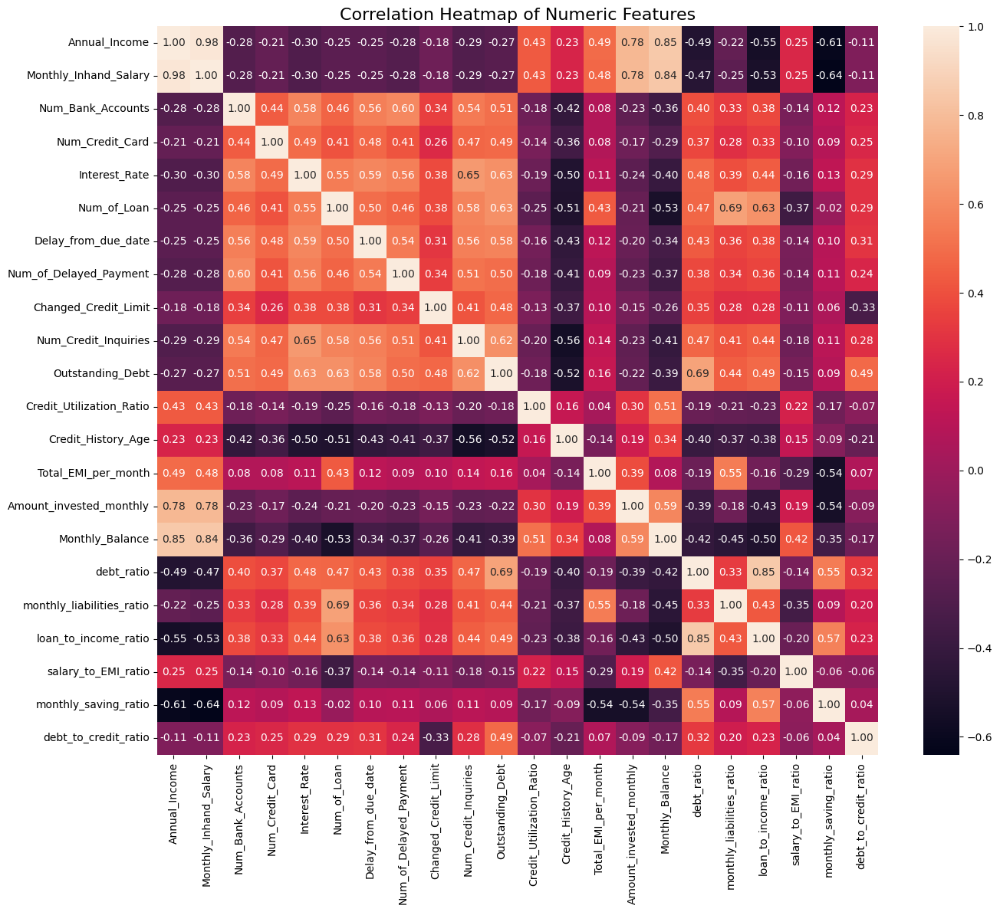

In [ ]:
import seaborn as sns
corr = number_types.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    annot_kws={"size":10}
)
plt.title("Correlation Heatmap of Numeric Features", fontsize=16)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Correlation is strong for some pairs. We can look at correlation > 0.5

---



---



In [ ]:
mask = np.triu(np.ones_like(corr, dtype=bool), k=1)
corr_pairs = (
    corr.where(mask)
        .stack()
        .reset_index()
        .rename(columns={'level_0': 'Feature_1', 'level_1': 'Feature_2', 0: 'Correlation'})
)
strong_corr = corr_pairs[(abs(corr_pairs['Correlation']) > 0.5) & (corr_pairs['Correlation'] != 1)]
strong_corr = strong_corr.sort_values(by='Correlation', key=abs, ascending=False)
print(strong_corr)
print(len(strong_corr))


                    Feature_1                  Feature_2  Correlation
0               Annual_Income      Monthly_Inhand_Salary     0.977716
14              Annual_Income            Monthly_Balance     0.849134
217                debt_ratio       loan_to_income_ratio     0.846507
34      Monthly_Inhand_Salary            Monthly_Balance     0.843660
33      Monthly_Inhand_Salary    Amount_invested_monthly     0.782338
13              Annual_Income    Amount_invested_monthly     0.781455
170          Outstanding_Debt                 debt_ratio     0.692736
106               Num_of_Loan  monthly_liabilities_ratio     0.688314
82              Interest_Rate       Num_Credit_Inquiries     0.654368
39      Monthly_Inhand_Salary       monthly_saving_ratio    -0.640420
107               Num_of_Loan       loan_to_income_ratio     0.630035
99                Num_of_Loan           Outstanding_Debt     0.627248
83              Interest_Rate           Outstanding_Debt     0.626298
153      Num_Credit_

*8* unique pairwise columns have correlation greater than .3. Let's visualize these

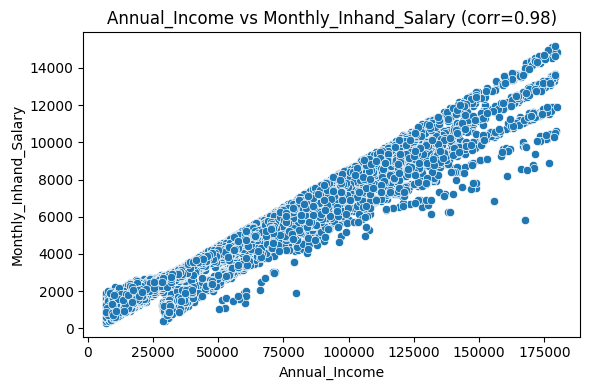

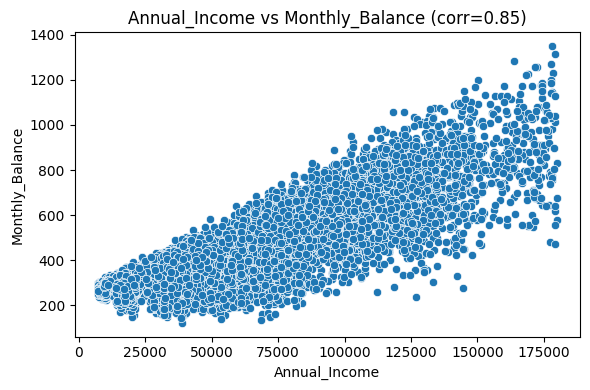

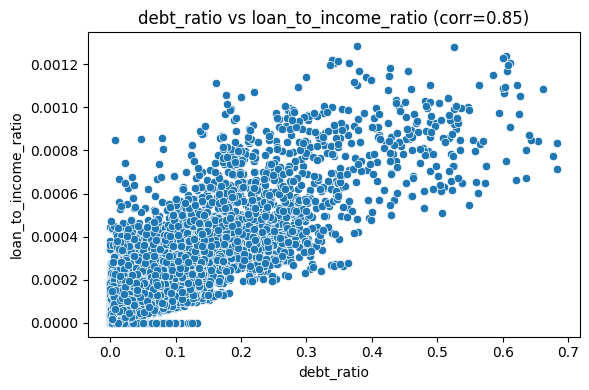

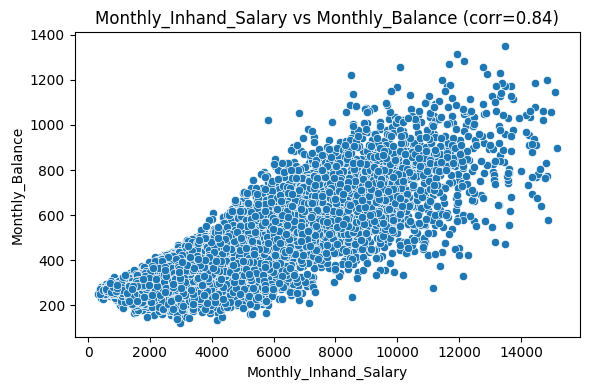

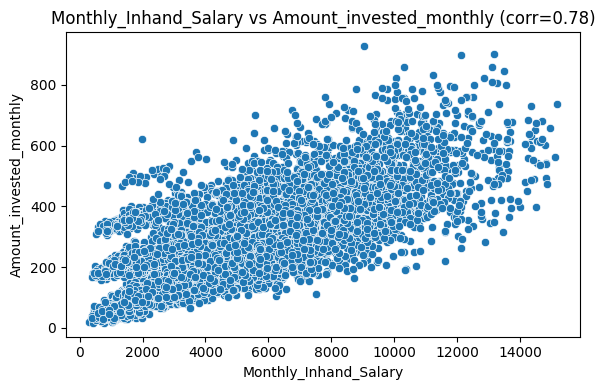

...

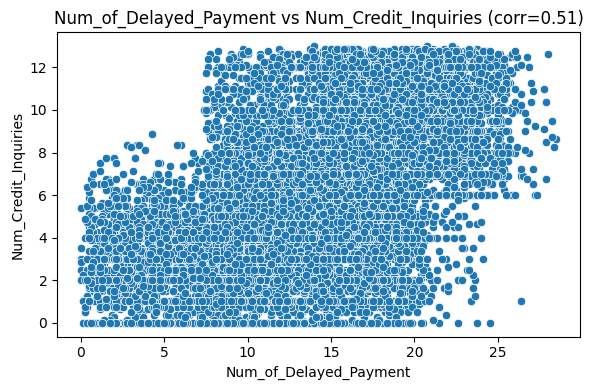

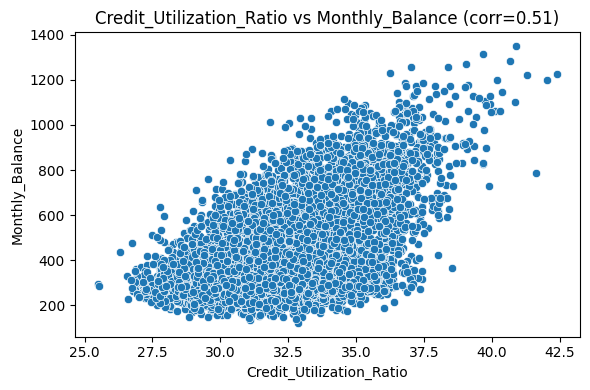

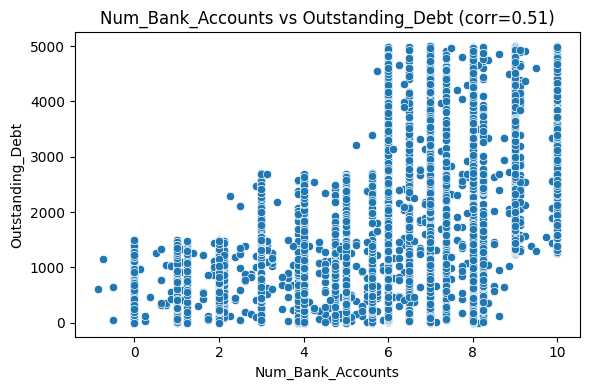

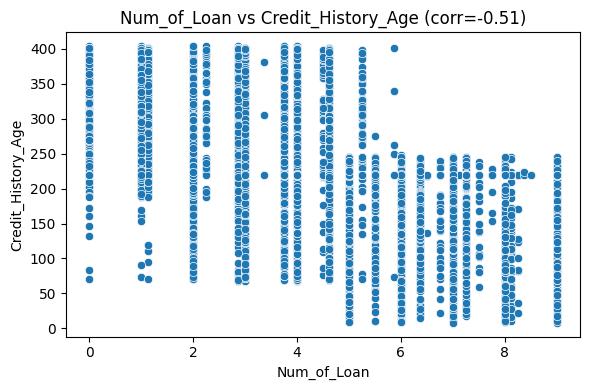

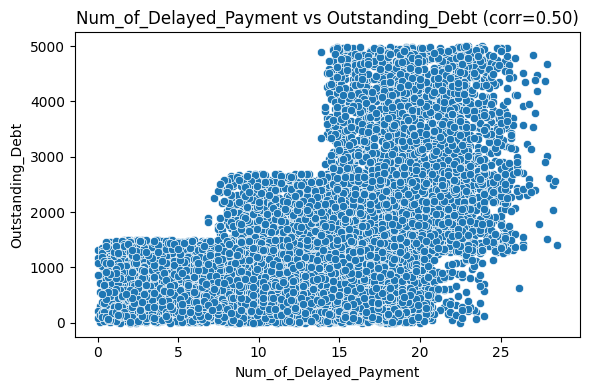

In [ ]:
for _, row in strong_corr.iterrows():
    feature_x = row['Feature_1']
    feature_y = row['Feature_2']
    corr_val = row['Correlation']

    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=number_types[feature_x], y=number_types[feature_y])
    plt.title(f"{feature_x} vs {feature_y} (corr={corr_val:.2f})")
    plt.xlabel(feature_x)
    plt.ylabel(feature_y)
    plt.tight_layout()
    plt.show()


Will try hexbin for better visualization

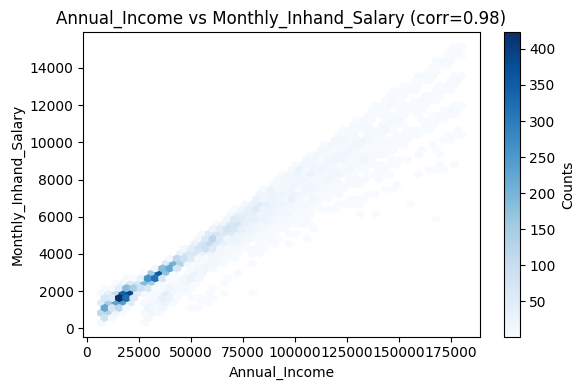

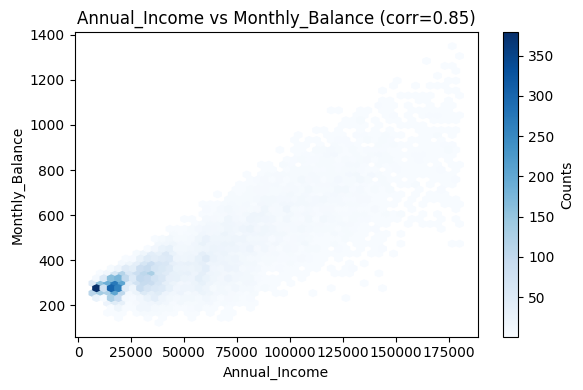

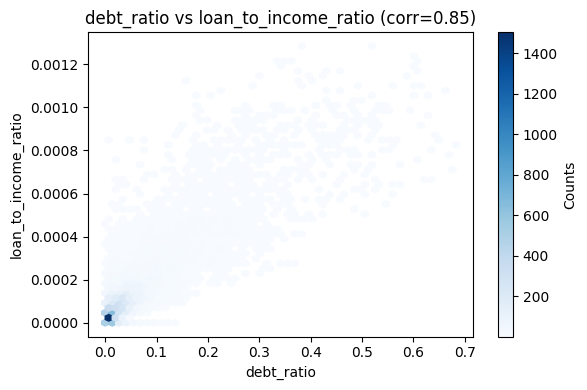

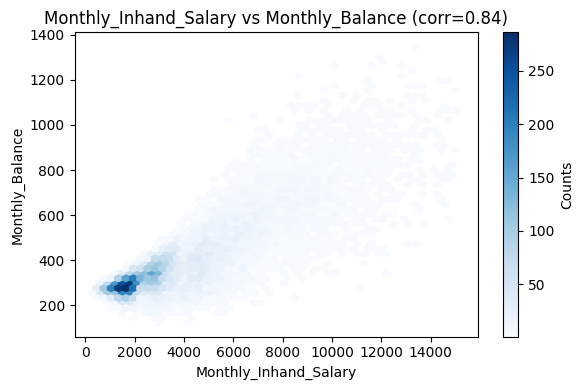

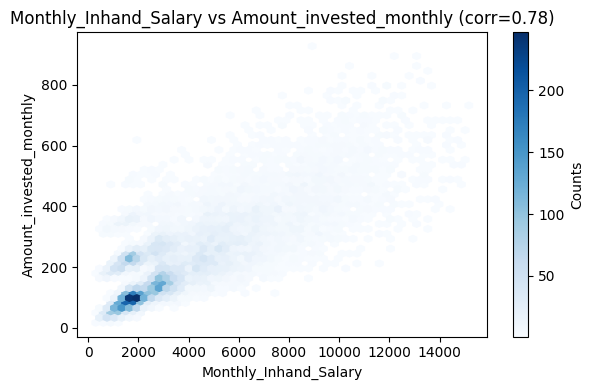

...

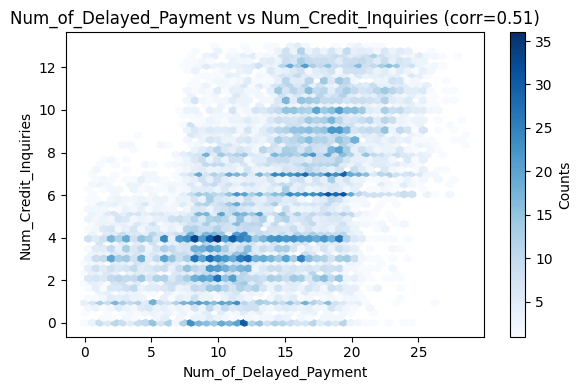

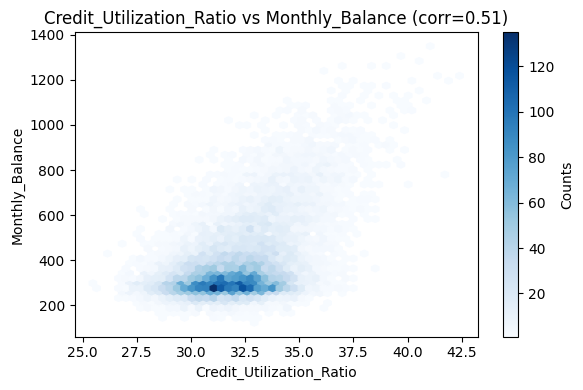

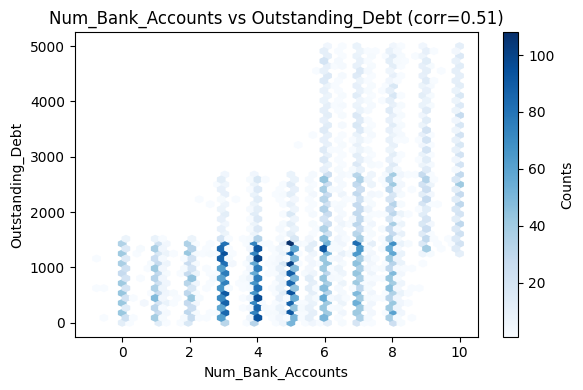

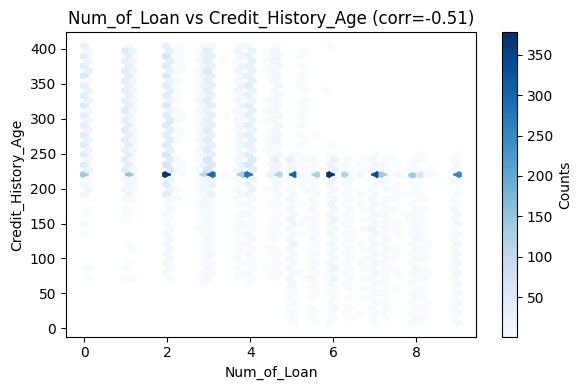

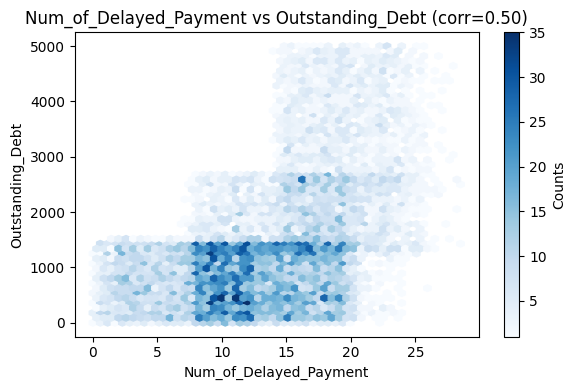

In [ ]:
for _, row in strong_corr.iterrows():
    feature_x = row['Feature_1']
    feature_y = row['Feature_2']
    corr_val = row['Correlation']

    plt.figure(figsize=(6, 4))
    plt.hexbin(
        number_types[feature_x],
        number_types[feature_y],
        gridsize=50,
        cmap='Blues',
        mincnt=1
    )
    plt.colorbar(label='Counts')
    plt.title(f"{feature_x} vs {feature_y} (corr={corr_val:.2f})")
    plt.xlabel(feature_x)
    plt.ylabel(feature_y)
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-80650155.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=x_labels, y=counts.values,  palette='Set2')


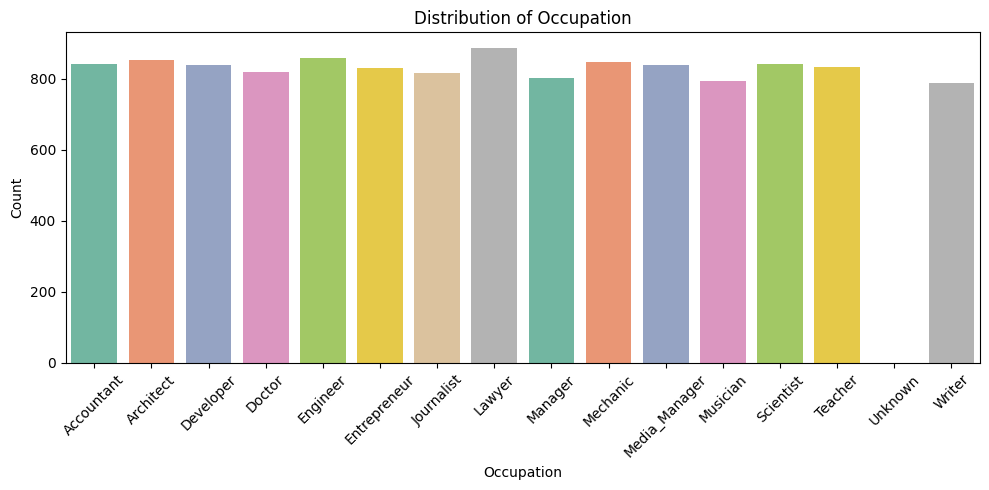

/tmp/ipython-input-80650155.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=x_labels, y=counts.values,  palette='Set2')


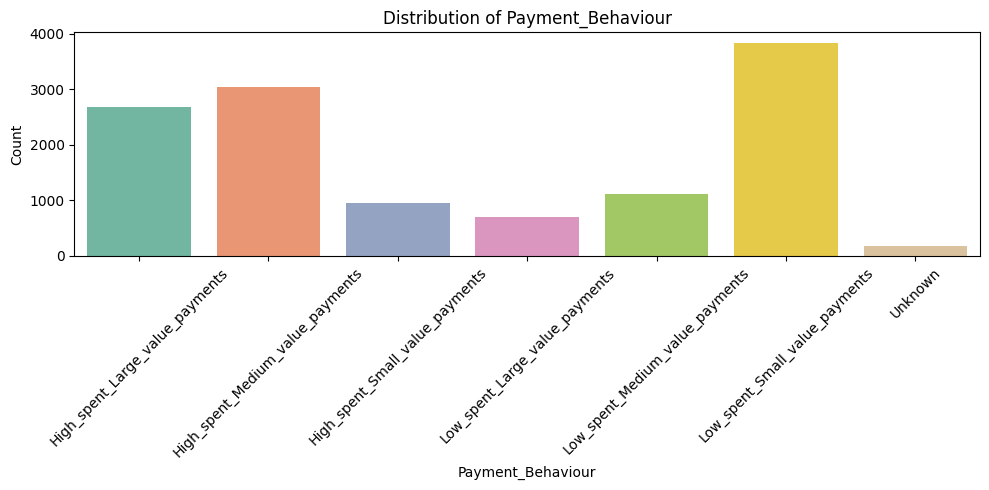

/tmp/ipython-input-80650155.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=x_labels, y=counts.values,  palette='Set2')


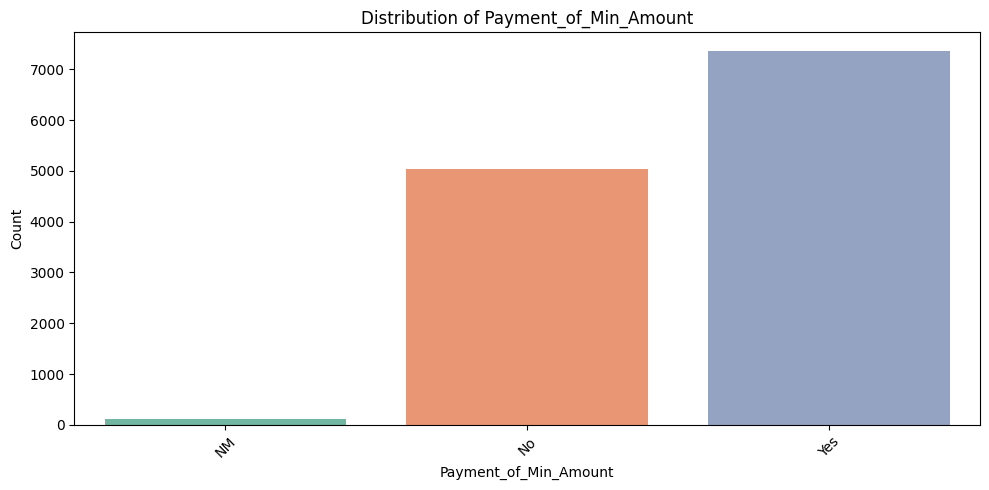

/tmp/ipython-input-80650155.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette='Set2')


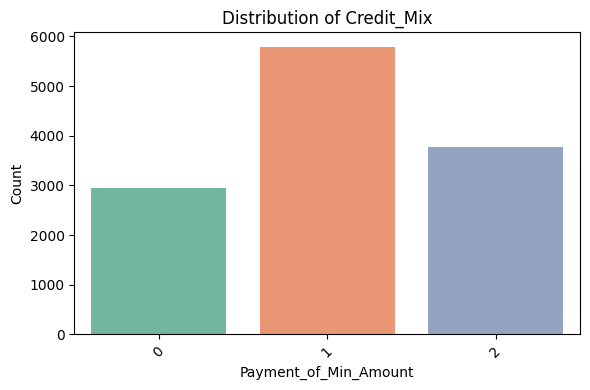

In [ ]:
one_hot_prefixes = ['Month_', 'Occupation_', 'Payment_Behaviour_', 'Payment_of_Min_Amount_']
one_hot_cols = [col for col in df.columns if any(col.startswith(p) for p in one_hot_prefixes)]
for prefix in one_hot_prefixes:
    cols = [col for col in one_hot_cols if col.startswith(prefix)]
    if not cols:
        continue

    counts = df[cols].sum()
    x_labels = [col.replace(prefix, '') for col in counts.index]

    plt.figure(figsize=(10,5))
    sns.barplot(x=x_labels, y=counts.values,  palette='Set2')
    plt.title(f'Distribution of {prefix[:-1]}')
    plt.ylabel('Count')
    plt.xlabel(prefix[:-1])
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


counts = df['Credit_Mix'].value_counts().sort_index()
plt.figure(figsize=(6,4))
sns.barplot(x=counts.index, y=counts.values, palette='Set2')
plt.title(f'Distribution of Credit_Mix')
plt.ylabel('Count')
plt.xlabel(col)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Everything seems pretty evenly distributed

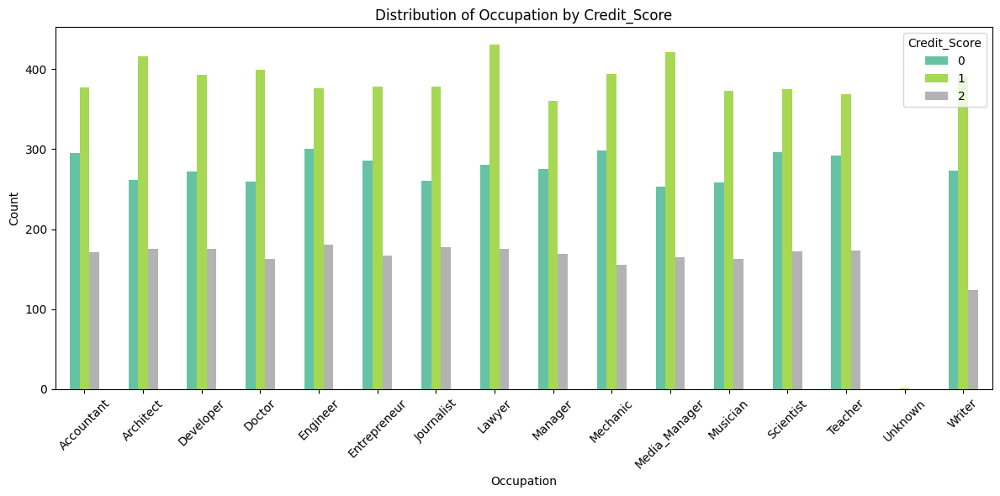

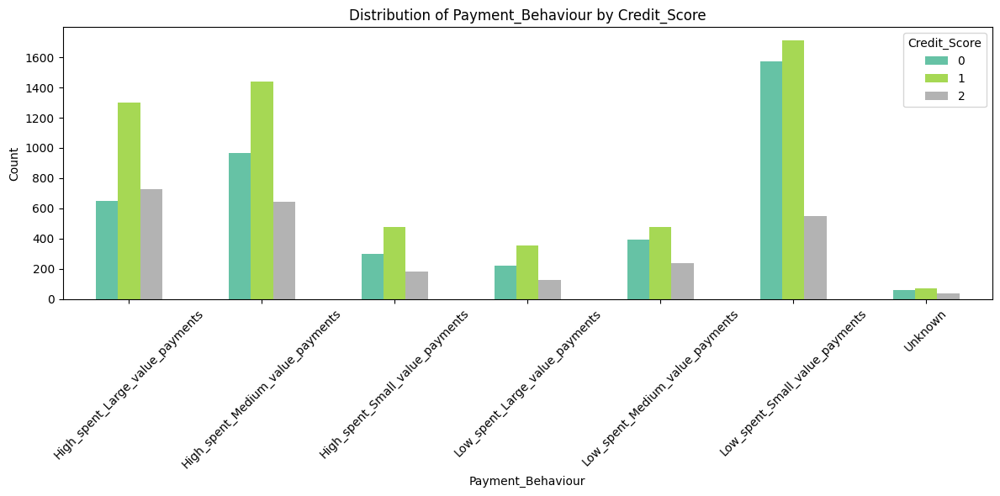

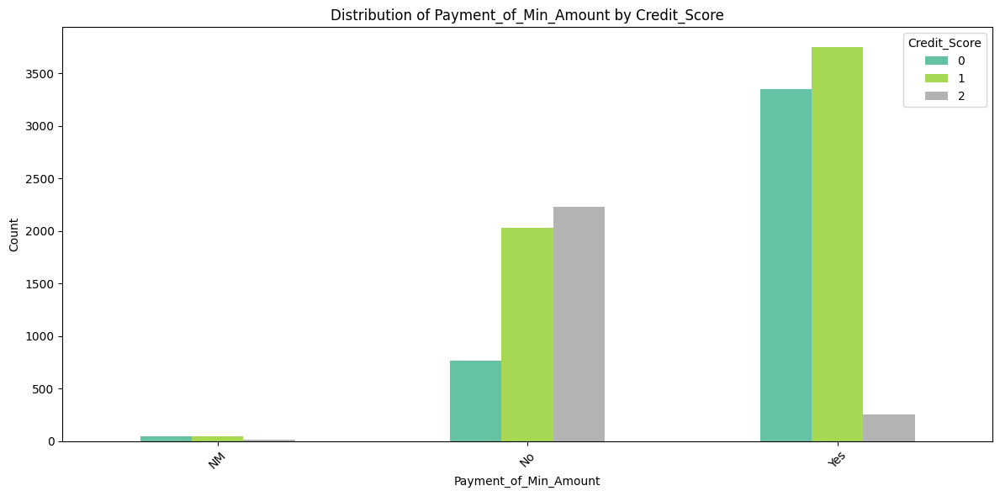

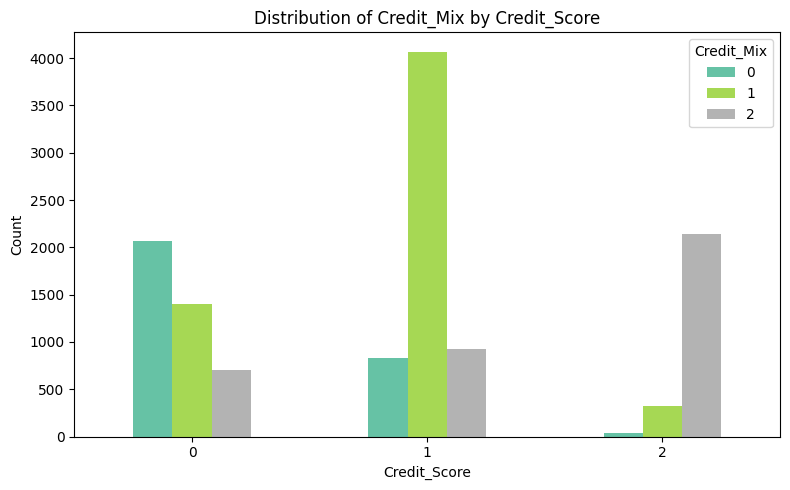

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
for prefix in one_hot_prefixes:
    cols = [col for col in one_hot_cols if col.startswith(prefix)]
    if not cols:
        continue
    grouped = df.groupby('Credit_Score')[cols].sum()
    grouped.index.name = 'Credit_Score'
    grouped = grouped.T
    grouped.index = [col.replace(prefix, '') for col in grouped.index]

    grouped.plot(kind='bar', figsize=(12,6), colormap='Set2')
    plt.title(f'Distribution of {prefix[:-1]} by Credit_Score')
    plt.ylabel('Count')
    plt.xlabel(prefix[:-1])
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

grouped = df.groupby('Credit_Score')['Credit_Mix'].value_counts().unstack(fill_value=0)
grouped.plot(kind='bar', figsize=(8,5), colormap='Set2')
plt.title('Distribution of Credit_Mix by Credit_Score')
plt.ylabel('Count')
plt.xlabel('Credit_Score')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


Seems normal, maybe low spent small value payments does contribute to credit score

##Performing Principal Component Analysis

In [ ]:
df=df_fe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 65 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Customer_ID                                         12500 non-null  object 
 1   Age                                                 12500 non-null  int64  
 2   Annual_Income                                       12500 non-null  float64
 3   Monthly_Inhand_Salary                               12500 non-null  float64
 4   Num_Bank_Accounts                                   12500 non-null  float64
 5   Num_Credit_Card                                     12500 non-null  float64
 6   Interest_Rate                                       12500 non-null  float64
 7   Num_of_Loan                                         12500 non-null  float64
 8   Delay_from_due_date                                 12500 non-null  float64


In [ ]:
from sklearn.preprocessing import StandardScaler

features = df.drop(columns = ['Credit_Score', 'Customer_ID']).columns.tolist()

# Separating out the features
x = df.loc[:, features].values

# Separating out the target
y = df.loc[:,['Credit_Score']].values

# Standardizing the features
x = StandardScaler().fit_transform(x)

pd.DataFrame(x, columns=features)



,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Payment_of_Min_Amount_Yes,debt_ratio,monthly_liabilities_ratio,loan_to_income_ratio,salary_to_EMI_ratio,monthly_saving_ratio,debt_to_credit_ratio,num_known_occupations,num_payment_flags,num_payment_of_min
0,-1.190908,-0.553606,-0.465689,0.222473,-0.311574,1.409675,-0.744464,2.787718,1.954071,-1.355160,...,0.835685,-0.082776,-0.685987,-0.444143,-0.236544,-0.103633,2.274608,0.0,0.0,0.0
1,-0.697880,0.013641,0.080864,0.222473,-0.311574,0.245402,0.358723,-0.935447,1.415882,-0.112895,...,0.835685,-0.641065,-0.270664,-0.318769,-0.251738,-0.417464,-0.805242,0.0,0.0,0.0
2,-1.190908,1.621440,1.722367,-1.723753,-0.802706,-1.617435,-1.584987,-0.512360,-1.081313,0.044168,...,-1.196623,-0.579741,-1.339299,-0.798458,5.298772,-0.590502,-0.399565,0.0,0.0,0.0
3,0.569907,0.186424,0.334483,-0.945263,-1.293838,0.245402,-0.324202,0.418431,0.124229,0.589736,...,0.835685,-0.591862,-0.292906,-0.522193,-0.251182,-0.922784,-0.732918,0.0,0.0,0.0
4,0.569907,1.224898,0.770102,-0.945263,-1.293838,-1.035298,-0.324202,-0.580054,-0.779927,-1.382854,...,-1.196623,-0.538856,0.396660,-0.633410,-0.261183,-0.775826,1.765016,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,1.415098,-0.909154,-0.954788,-2.112999,0.670690,-1.049852,-0.324202,-0.596978,-0.866038,-0.309917,...,-1.196623,0.167323,-0.354118,0.157136,-0.250193,0.949676,-0.154376,0.0,0.0,0.0
12496,0.076879,-0.686472,-0.558506,1.000964,0.670690,-0.103880,0.516321,-0.351587,-0.263266,-0.354227,...,0.835685,-0.335457,0.358871,0.263456,-0.260938,-0.371146,-0.431834,0.0,0.0,0.0
12497,-1.190908,1.722365,2.082117,-0.166772,0.179558,-1.617435,-0.744464,-1.434690,-1.447281,0.230508,...,-1.196623,-0.652888,-0.793550,-0.706215,-0.227922,-0.966624,-0.762108,0.0,0.0,0.0
12498,-1.190908,0.237657,0.434461,0.222473,1.161822,1.409675,1.777106,1.645383,0.447143,-0.245430,...,0.835685,-0.434094,0.852138,-0.085454,-0.264368,-0.954769,-0.143531,0.0,0.0,0.0


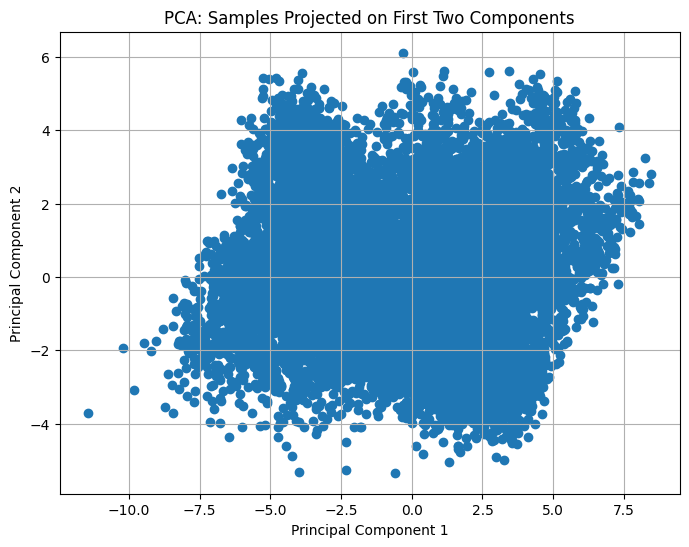

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])


#PCA Scatter Plot
plt.figure(figsize=(8, 6))
plt.scatter(principalDf['principal component 1'], principalDf['principal component 2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Samples Projected on First Two Components')
plt.grid(True)
plt.show()


In [ ]:
print(pca.explained_variance_ratio_) #our principal components account fos around 16.8 percent of variation


[0.18851401 0.0698214 ]


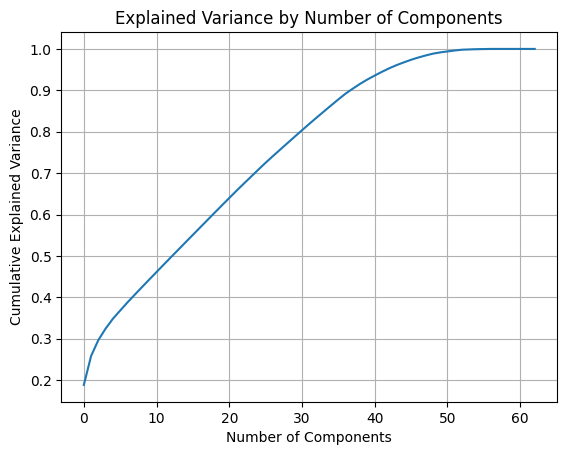

In [ ]:
pca_full = PCA().fit(x)
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid(True)
plt.show()
#for pca, its best to have 70-90 percent explained variance

In [ ]:
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=features
)
display(loadings.iloc[:, :2])

,PC1,PC2
Age,0.059690,-0.039098
Annual_Income,0.173862,0.361337
Monthly_Inhand_Salary,0.173142,0.361491
Num_Bank_Accounts,-0.202517,0.066341
Num_Credit_Card,-0.168604,0.065647
...,...,...
monthly_saving_ratio,-0.093652,-0.351264
debt_to_credit_ratio,-0.100554,0.042843
num_known_occupations,-0.000000,-0.000000
num_payment_flags,-0.000000,-0.000000


In [ ]:
from sklearn.preprocessing import StandardScaler

#start from pca copy because it has the non-standardized vals

# features/target
y = df['Credit_Score']
X = df.drop(columns=number_types)

#Need to keep only continuous vars
num = X.select_dtypes(include=['number']).copy()

# get rid of extremes
# winsorize: clip each column at 0.5% and 99.5% percentiles
q_low  = num.quantile(0.005)
q_high = num.quantile(0.995)
num_clip = num.clip(lower=q_low, upper=q_high, axis=1)

# I tried robust scale, the result was worse so i switched to standard scale
Xs = pd.DataFrame(StandardScaler().fit_transform(num_clip),
                  columns=num_clip.columns, index=num_clip.index)

#PCA
pca = PCA(n_components=2, random_state=0)
pc = pca.fit_transform(Xs)
principalDf = pd.DataFrame(pc, columns=['PC1','PC2'], index=Xs.index)

print("explained variance:", pca.explained_variance_ratio_)


explained variance: [0.21500676 0.07739737]


This test has an explained variance of 23% which is slightly better than above.


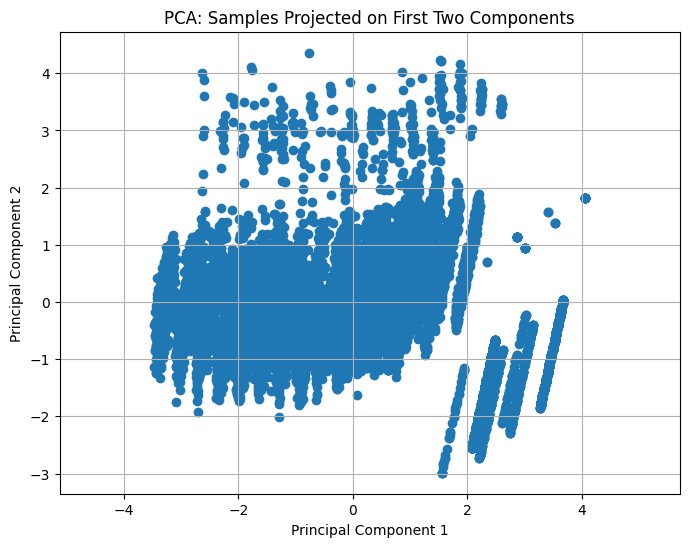

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(principalDf['PC1'], principalDf['PC2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Samples Projected on First Two Components')
plt.grid(True)
plt.axis('equal')
plt.show()




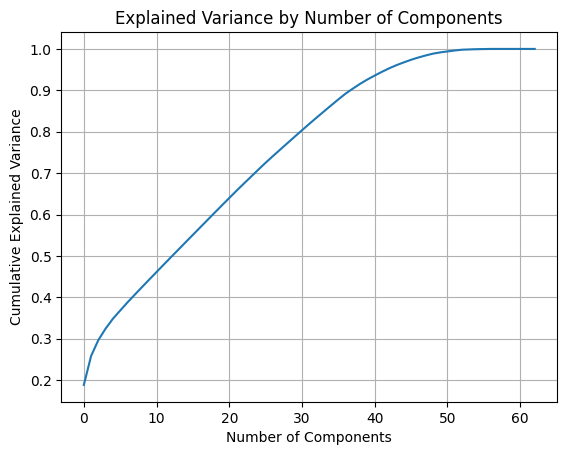

In [ ]:
pca_full = PCA().fit(x)
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid(True)
plt.show()
#for pca, its best to have 70-90 percent explained variance

**The** plot above shows how much variance is explained by the number of components. We can choose to increase the amount of components we have to capture more of the data.

In [ ]:
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=Xs.columns
)
display(loadings.iloc[:, :2])

,PC1,PC2
Age,0.156986,0.725560
Credit_Mix,0.481626,0.187870
Credit_Score,0.381018,0.313989
Debt Consolidation Loan,-0.226356,-0.076766
Personal Loan,-0.227689,-0.007024
Auto Loan,-0.227352,0.091116
Mortgage Loan,-0.235807,0.026034
Not Specified,-0.224486,0.064876
Unknown,0.355873,-0.469710
Student Loan,-0.217974,0.107072


##Scaling Data

In [ ]:
number_types

,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,...,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,debt_ratio,monthly_liabilities_ratio,loan_to_income_ratio,salary_to_EMI_ratio,monthly_saving_ratio,debt_to_credit_ratio
0,30625.940,2754.609583,6.0,5.0,27.000,2.000,62.250,25.000,1.8800,10.875,...,129.0,42.941090,158.549735,335.375341,0.051031,0.015583,0.000065,62.688694,0.121706,542.677083
1,52312.680,4250.390000,6.0,5.0,17.000,4.625,7.250,21.875,9.7300,3.000,...,372.0,108.366467,146.679378,428.743155,0.003874,0.025490,0.000088,38.863741,0.100848,18.889096
2,113781.390,8742.777813,1.0,4.0,1.000,0.000,13.500,7.375,10.7225,3.250,...,219.0,0.000000,539.705605,781.229776,0.009054,0.000000,0.000000,8742.777813,0.089347,87.882278
3,58918.470,4944.481563,3.0,3.0,17.000,3.000,27.250,14.375,14.1700,7.750,...,190.0,123.434939,415.853300,332.642837,0.008030,0.024959,0.000051,39.735476,0.067262,31.189189
4,98620.980,6136.663750,3.0,3.0,6.000,3.000,12.500,9.125,1.7050,3.000,...,219.0,254.142417,355.442408,472.781009,0.012507,0.041407,0.000030,24.051915,0.077029,456.011091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,17032.785,1416.067031,0.0,7.0,5.875,3.000,12.250,8.625,8.4850,4.250,...,219.0,33.299764,83.918549,271.671562,0.072155,0.023499,0.000176,41.285038,0.191714,129.581444
12496,25546.260,2500.591250,8.0,7.0,14.000,5.000,15.875,12.125,8.2050,5.250,...,225.0,101.328637,152.775690,259.981173,0.029688,0.040506,0.000196,24.436866,0.103926,82.394351
12497,117639.920,9727.326667,5.0,6.0,1.000,2.000,-0.125,5.250,11.9000,2.500,...,299.0,126.638453,647.439037,625.999905,0.002876,0.013017,0.000017,76.210001,0.064348,26.224806
12498,60877.170,5218.097500,6.0,8.0,27.000,8.000,45.375,16.250,8.8925,12.375,...,219.0,272.809169,280.326352,339.951771,0.021356,0.052271,0.000131,19.057424,0.065136,131.425828


In [ ]:
scaler = StandardScaler()
# calculates the mean and standard deviation of each column & subtracts the mean and divides by the std to standardize the data
# mean = 0, std = 1
number_types = df.select_dtypes(include=('float64')).columns.tolist()
df[number_types] = scaler.fit_transform(df[number_types])
df[number_types].describe()






,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,...,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,debt_ratio,monthly_liabilities_ratio,loan_to_income_ratio,salary_to_EMI_ratio,monthly_saving_ratio,debt_to_credit_ratio
count,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,...,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04,1.250000e+04
mean,1.205080e-16,5.030643e-17,8.526513e-17,-1.523404e-16,5.442757e-17,-4.774847e-17,-3.382183e-17,-6.195933e-17,-1.648459e-17,-6.025402e-17,...,1.523404e-16,4.092726e-17,1.443823e-16,-1.853095e-16,3.524292e-17,-6.252776e-17,-8.810730e-18,-3.410605e-18,2.739853e-16,-1.115552e-16
std,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,...,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00,1.000040e+00
min,-1.171420e+00,-1.361263e+00,-2.453588e+00,-2.521668e+00,-1.617435e+00,-1.584987e+00,-1.561616e+00,-2.351438e+00,-1.573545e+00,-1.677520e+00,...,-2.867653e+00,-1.149938e+00,-1.539548e+00,-1.616970e+00,-6.869018e-01,-1.339299e+00,-7.984580e-01,-2.744570e-01,-1.560769e+00,-9.161644e-01
25%,-8.299532e-01,-7.842216e-01,-6.046731e-01,-8.027061e-01,-8.024436e-01,-7.444641e-01,-7.577509e-01,-7.153448e-01,-7.690403e-01,-8.176853e-01,...,-3.163035e-01,-7.302547e-01,-8.169877e-01,-6.788161e-01,-5.760172e-01,-7.150383e-01,-6.236981e-01,-2.623012e-01,-6.755527e-01,-5.620098e-01
50%,-3.357109e-01,-3.407540e-01,7.650616e-02,-4.616641e-03,-1.038799e-01,-9.006208e-03,-2.161995e-01,8.117434e-02,-1.698651e-01,-1.011566e-01,...,-2.800284e-01,-2.998041e-01,-1.653943e-01,-3.674637e-01,-3.639004e-01,-1.705147e-01,-3.464464e-01,-2.539341e-01,-2.140819e-01,-2.377111e-01
75%,5.560606e-01,5.330156e-01,7.576854e-01,6.706899e-01,5.946838e-01,7.264517e-01,4.692015e-01,7.700557e-01,6.484869e-01,7.586777e-01,...,7.235832e-01,5.006840e-01,5.632201e-01,3.604968e-01,1.015957e-01,5.211124e-01,1.824443e-01,-2.347960e-01,3.939525e-01,1.746402e-01
max,3.353147e+00,4.069821e+00,1.779454e+00,2.144086e+00,2.108238e+00,2.197368e+00,2.855412e+00,2.556842e+00,3.271288e+00,2.048429e+00,...,1.920662e+00,3.312038e+00,4.944900e+00,5.502684e+00,7.401040e+00,1.143344e+01,6.170562e+00,9.354027e+00,1.037425e+01,1.333592e+01


In [ ]:
# avg_spend_cols = ['avg_spend_3m','avg_spend_6m','avg_spend_9m','avg_spend_12m']
# df[avg_spend_cols] = scaler.fit_transform(df[avg_spend_cols])
# df[avg_spend_cols].describe()

##Model Building

Will train a Decision Tree, XGBoost, CatBoost, LightGBM, and Neural Network model

In [ ]:
!pip install catboost
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

In [ ]:
X = df.drop(columns=['Credit_Score', 'Customer_ID'])
y = df['Credit_Score']

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 67)

In [ ]:
X.shape, y.shape

((12500, 63), (12500,))

In [ ]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
)
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def evaluate_model(model, X_test, y_test, plot_cm=True):
    y_pred = model.predict(X_test)

    try:
        y_proba = model.predict_proba(X_test)
        roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
    except AttributeError:
        roc_auc = None

    metrics_dict = {
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted'),
        'Recall': recall_score(y_test, y_pred, average='weighted'),
        'F1 Score': f1_score(y_test, y_pred, average='weighted'),
        'ROC AUC': roc_auc
    }

    print(f"Metrics for {type(model).__name__}:")
    for k, v in metrics_dict.items():
        if v is not None:
            print(f"{k}: {v:.4f}")
    if plot_cm:
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(6,5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.title(f'Confusion Matrix: {type(model).__name__}')
        plt.show()

    return metrics_dict

Training XGBoost model

In [ ]:
#uncomment to fit
xgb_param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [6, 10, 12],
    'learning_rate': [0.01, 0.05, 0.1]
}
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
xgb_grid = GridSearchCV(xgb_model, xgb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)

X_np = X_train.values
X_test_np = X_test.reindex(columns=X_train.columns, fill_value=0).values


xgb_grid.fit(X_train, y_train)
best_xgb = xgb_grid.best_estimator_



/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [17:02:25] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [ ]:
#uncomment to download model and grid
best_xgb = xgb_grid.best_estimator_
import pickle
from google.colab import files
with open('best_xgb.pkl', 'wb') as f:
  pickle.dump(best_xgb, f)
with open('xgb_grid.pkl', 'wb') as f:
    pickle.dump(xgb_grid, f)
files.download('best_xgb.pkl')
files.download('xgb_grid.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#load model and param grid
import pickle
folder_path = '/content/drive/My Drive/Colab Notebooks/Amex 1B/'
best_xgb_path = os.path.join(folder_path, 'best_xgb.pkl')
xgb_grid_path = os.path.join(folder_path, 'xgb_grid.pkl')
with open(best_xgb_path, 'rb') as f:
    best_xgb = pickle.load(f)
with open(xgb_grid_path, 'rb') as f:
    xgb_grid = pickle.load(f)

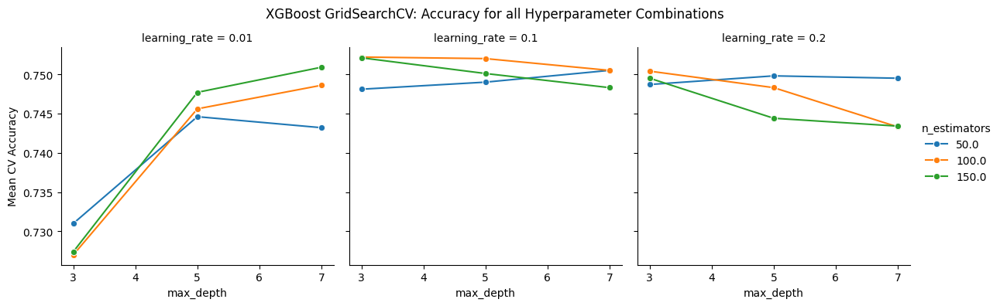

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

results_df = pd.DataFrame(xgb_grid.cv_results_)[['params', 'mean_test_score', 'std_test_score']]

params_df = results_df['params'].apply(pd.Series)
plot_df = pd.concat([params_df, results_df[['mean_test_score']]], axis=1)

plot_df['n_estimators'] = plot_df['n_estimators'].astype(str)
plot_df['learning_rate'] = plot_df['learning_rate'].astype(str)

g = sns.FacetGrid(plot_df, col='learning_rate', height=4, aspect=1)
g.map_dataframe(sns.lineplot, x='max_depth', y='mean_test_score', hue='n_estimators', marker='o')
g.add_legend(title='n_estimators')
g.set_axis_labels("max_depth", "Mean CV Accuracy")
g.set_titles("learning_rate = {col_name}")
plt.subplots_adjust(top=0.85)
g.fig.suptitle("XGBoost GridSearchCV: Accuracy for all Hyperparameter Combinations")
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

y_pred = best_xgb.predict(X_test_np)
y_proba = best_xgb.predict_proba(X_test_np)
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred, average='weighted')
rec = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
print("Best XGBoost metrics:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")


Best XGBoost metrics:
Accuracy: 0.7544
Precision: 0.7620
Recall: 0.7544
F1 Score: 0.7555
ROC AUC: 0.8835


Metrics for XGBClassifier:
Accuracy: 0.7544
Precision: 0.7620
Recall: 0.7544
F1 Score: 0.7555
ROC AUC: 0.8835


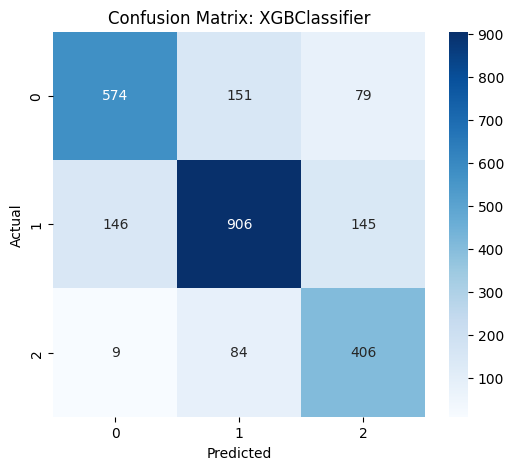

In [ ]:
metrics_xgb = evaluate_model(best_xgb, X_test_np, y_test)


Training CatBoost Model

In [ ]:
#uncomment to fit
cat_param_grid = {
    'iterations': [50, 100, 150],
    'depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2]
}
cat_model = CatBoostClassifier(verbose=0)
cat_grid = GridSearchCV(cat_model, cat_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
cat_grid.fit(X_train, y_train)
best_cat = cat_grid.best_estimator_



In [ ]:
#uncomment to download
best_cat = cat_grid.best_estimator_
import pickle
from google.colab import files
with open('best_cat.pkl', 'wb') as f:
  pickle.dump(best_cat, f)
with open('cat_grid.pkl', 'wb') as f:
    pickle.dump(cat_grid, f)
files.download('best_cat.pkl')
files.download('cat_grid.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#load model and param grid
folder_path = '/content/drive/My Drive/Colab Notebooks/Amex 1B/'
best_cat_path = os.path.join(folder_path, 'best_cat.pkl')
cat_grid_path = os.path.join(folder_path, 'cat_grid.pkl')
with open(best_cat_path, 'rb') as f:
    best_cat = pickle.load(f)
with open(cat_grid_path, 'rb') as f:
    cat_grid = pickle.load(f)

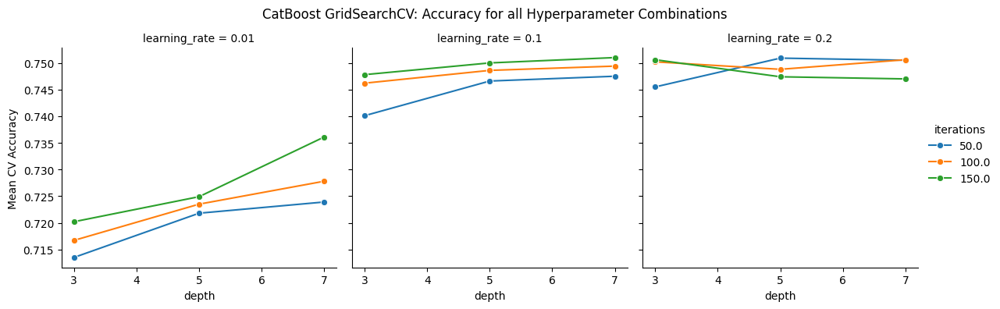

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

results_df = pd.DataFrame(cat_grid.cv_results_)[['params', 'mean_test_score', 'std_test_score']]

params_df = results_df['params'].apply(pd.Series)
plot_df = pd.concat([params_df, results_df[['mean_test_score']]], axis=1)

plot_df['iterations'] = plot_df['iterations'].astype(str)
plot_df['learning_rate'] = plot_df['learning_rate'].astype(str)

g = sns.FacetGrid(plot_df, col='learning_rate', height=4, aspect=1)
g.map_dataframe(sns.lineplot, x='depth', y='mean_test_score', hue='iterations', marker='o')
g.add_legend(title='iterations')
g.set_axis_labels("depth", "Mean CV Accuracy")
g.set_titles("learning_rate = {col_name}")
plt.subplots_adjust(top=0.85)
g.fig.suptitle("CatBoost GridSearchCV: Accuracy for all Hyperparameter Combinations")
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

y_pred = best_cat.predict(X_test)
y_proba = best_cat.predict_proba(X_test)
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred, average='weighted')
rec = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
print("Best CatBoost metrics:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")


Best CatBoost metrics:
Accuracy: 0.7552
Precision: 0.7652
Recall: 0.7552
F1 Score: 0.7563
ROC AUC: 0.8828


Metrics for CatBoostClassifier:
Accuracy: 0.7552
Precision: 0.7652
Recall: 0.7552
F1 Score: 0.7563
ROC AUC: 0.8828


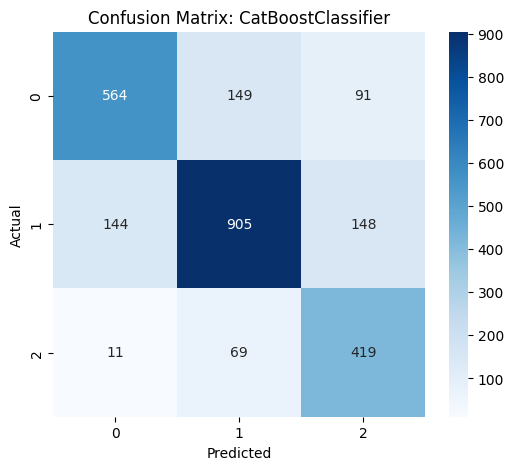

In [ ]:
metrics_cat = evaluate_model(best_cat, X_test, y_test)


Training LGBM Model

In [ ]:
#uncomment to fit

lgbm_param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2]
}
lgbm_model = LGBMClassifier()
lgbm_grid = GridSearchCV(lgbm_model, lgbm_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lgbm_grid.fit(X_train, y_train)
best_lgbm = lgbm_grid.best_estimator_


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002584 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4760
[LightGBM] [Info] Number of data points in the train set: 10000, number of used features: 59
[LightGBM] [Info] Start training from score -1.091240
[LightGBM] [Info] Start training from score -0.768949
[LightGBM] [Info] Start training from score -1.605944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

In [ ]:
#uncomment to download
import pickle
best_lgbm = lgbm_grid.best_estimator_
with open('best_lgbm.pkl', 'wb') as f:
  pickle.dump(best_lgbm, f)
with open('lgbm_grid.pkl', 'wb') as f:
  pickle.dump(lgbm_grid, f)
files.download('best_lgbm.pkl')
files.download('lgbm_grid.pkl')






<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#load model and param grid
folder_path = '/content/drive/My Drive/Colab Notebooks/Amex 1B/'
best_lgbm_path = os.path.join(folder_path, 'best_lgbm.pkl')
lgbm_grid_path = os.path.join(folder_path, 'lgbm_grid.pkl')
with open(best_lgbm_path, 'rb') as f:
    best_lgbm = pickle.load(f)
with open(lgbm_grid_path, 'rb') as f:
    lgbm_grid = pickle.load(f)

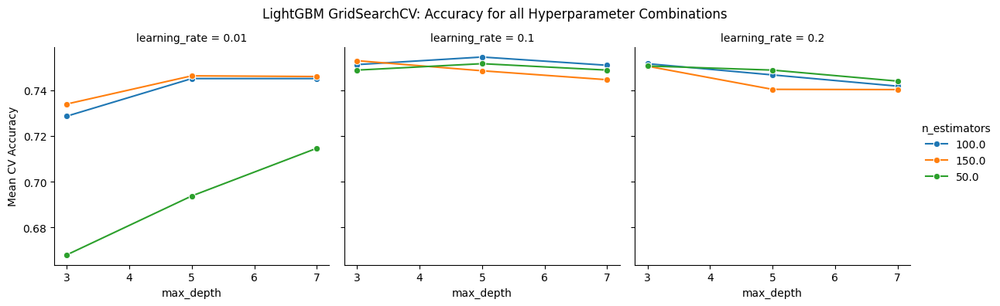

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

results_df = pd.DataFrame(lgbm_grid.cv_results_)[['params', 'mean_test_score', 'std_test_score']]

params_df = results_df['params'].apply(pd.Series)
plot_df = pd.concat([params_df, results_df[['mean_test_score']]], axis=1)

plot_df['n_estimators'] = plot_df['n_estimators'].astype(str)
plot_df['learning_rate'] = plot_df['learning_rate'].astype(str)

plot_df = plot_df.sort_values(['learning_rate', 'n_estimators', 'max_depth'])

g = sns.FacetGrid(plot_df, col='learning_rate', height=4, aspect=1)
g.map_dataframe(
    sns.lineplot,
    x='max_depth',
    y='mean_test_score',
    hue='n_estimators',
    marker='o'
)
g.add_legend(title='n_estimators')
g.set_axis_labels("max_depth", "Mean CV Accuracy")
g.set_titles("learning_rate = {col_name}")
plt.subplots_adjust(top=0.85)
g.fig.suptitle("LightGBM GridSearchCV: Accuracy for all Hyperparameter Combinations")
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

y_pred = best_lgbm.predict(X_test)
y_proba = best_lgbm.predict_proba(X_test)
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred, average='weighted')
rec = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
print("Best LGBM metrics:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")


Best LGBM metrics:
Accuracy: 0.7532
Precision: 0.7602
Recall: 0.7532
F1 Score: 0.7542
ROC AUC: 0.8832


Metrics for LGBMClassifier:
Accuracy: 0.7532
Precision: 0.7602
Recall: 0.7532
F1 Score: 0.7542
ROC AUC: 0.8832


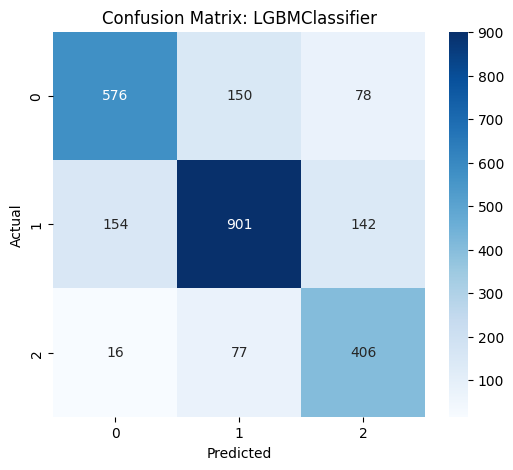

In [ ]:


metrics_lgbm = evaluate_model(best_lgbm, X_test, y_test)



##Neural Network Training

In [ ]:
#Ready Data for NN
import torch
from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.preprocessing import StandardScaler

X = X.astype('float32')
y = y.astype('int64')

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_tensor = torch.tensor(X_scaled)
y_tensor = torch.tensor(y)

dataset = TensorDataset(X_tensor, y_tensor)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)


In [ ]:
#Model
import torch
import torch.nn as nn

class SimpleMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=None):
        super(SimpleMLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return x

def load_model(state_dict_path, input_dim, output_dim, hidden_dim=64):
    model = SimpleMLP(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim)
    state_dict = torch.load(state_dict_path)
    model.load_state_dict(state_dict)
    model.eval()
    return model


In [ ]:
#Uncomment to train
#Training Model
import torch.optim as optim
import torch.nn.functional as F
from google.colab import files

input_dim = X.shape[1]
output_dim = len(torch.unique(y_tensor))
model = SimpleMLP(input_dim=input_dim, hidden_dim=64, output_dim=output_dim)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

epochs = 50
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(train_loader):.4f}")





Epoch 1/50, Loss: 0.8759
Epoch 2/50, Loss: 0.7097
Epoch 3/50, Loss: 0.6755
Epoch 4/50, Loss: 0.6566
Epoch 5/50, Loss: 0.6384
Epoch 6/50, Loss: 0.6314
Epoch 7/50, Loss: 0.6210
Epoch 8/50, Loss: 0.6062
Epoch 9/50, Loss: 0.6023
Epoch 10/50, Loss: 0.5919
Epoch 11/50, Loss: 0.5880
Epoch 12/50, Loss: 0.5836
Epoch 13/50, Loss: 0.5768
Epoch 14/50, Loss: 0.5679
Epoch 15/50, Loss: 0.5596
Epoch 16/50, Loss: 0.5630
Epoch 17/50, Loss: 0.5514
Epoch 18/50, Loss: 0.5495
Epoch 19/50, Loss: 0.5399
Epoch 20/50, Loss: 0.5324
Epoch 21/50, Loss: 0.5267
Epoch 22/50, Loss: 0.5218
Epoch 23/50, Loss: 0.5180
Epoch 24/50, Loss: 0.5133
Epoch 25/50, Loss: 0.5108
Epoch 26/50, Loss: 0.5006
Epoch 27/50, Loss: 0.4960
Epoch 28/50, Loss: 0.4941
Epoch 29/50, Loss: 0.4895
Epoch 30/50, Loss: 0.4860
Epoch 31/50, Loss: 0.4754
Epoch 32/50, Loss: 0.4715
Epoch 33/50, Loss: 0.4703
Epoch 34/50, Loss: 0.4616
Epoch 35/50, Loss: 0.4596
Epoch 36/50, Loss: 0.4503
Epoch 37/50, Loss: 0.4497
Epoch 38/50, Loss: 0.4460
Epoch 39/50, Loss: 0.

In [ ]:
#Uncomment to download
#Saves model
model_path = "model_state.pth"
torch.save(model.state_dict(), model_path)
print(f"Model saved as {model_path}")

files.download(model_path)

Model saved as model_state.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Loads model
folder_path = '/content/drive/My Drive/Colab Notebooks/Amex 1B/'
model_path = os.path.join(folder_path, 'model_state.pth')
input_dim = X.shape[1]
output_dim = len(torch.unique(y_tensor))
model = SimpleMLP(input_dim=input_dim, hidden_dim=64, output_dim=output_dim)
model.load_state_dict(torch.load(model_path))
model.eval()

SimpleMLP(
  (fc1): Linear(in_features=63, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=3, bias=True)
)

In [ ]:
#Evaluates Model
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
y_true = []
y_pred = []

with torch.no_grad():
    for X_batch, y_batch in test_loader:
        outputs = model(X_batch)
        _, preds = torch.max(outputs, 1)
        y_pred.extend(preds.numpy())
        y_true.extend(y_batch.numpy())

acc = accuracy_score(y_true, y_pred)
prec = precision_score(y_true, y_pred, average='weighted')
rec = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f"Test Accuracy: {acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1: {f1:.4f}")



Test Accuracy: 0.7556, Precision: 0.7554, Recall: 0.7556, F1: 0.7552


Confusion Matrix:
[[604 169  48]
 [140 946  99]
 [ 39 116 339]]


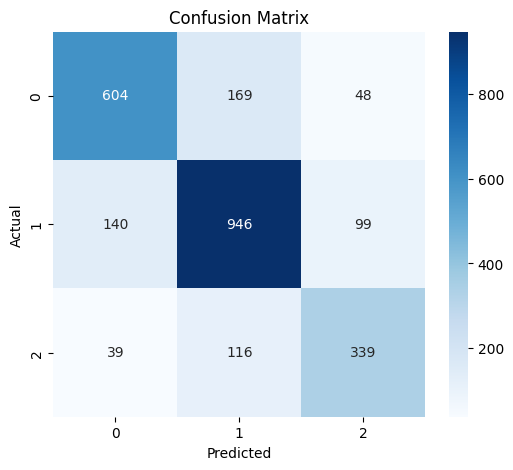

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()
